# Install Requirements for AWS SageMaker

In [ ]:
pip install gdown

Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install ipython-autotime
%load_ext autotime

time: 2.43 ms (started: 2021-12-11 14:51:02 +00:00)


In [ ]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.
time: 1.32 s (started: 2021-12-04 23:17:18 +00:00)


In [ ]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.
time: 1.61 s (started: 2021-12-04 23:17:20 +00:00)


In [ ]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.
time: 1.57 s (started: 2021-12-04 23:17:21 +00:00)


In [ ]:
pip install torch torchvision torchaudio

Note: you may need to restart the kernel to use updated packages.
time: 1.22 s (started: 2021-12-04 23:17:23 +00:00)


In [ ]:
pip install tables

Note: you may need to restart the kernel to use updated packages.
time: 1.28 s (started: 2021-12-04 23:17:24 +00:00)


In [ ]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.
time: 1.38 s (started: 2021-12-04 23:17:26 +00:00)


In [ ]:
pip install transformers

     |████████████████████████████████| 3.3 MB 12.3 MB/s 
     |████████████████████████████████| 3.3 MB 40.1 MB/s 
     |████████████████████████████████| 895 kB 38.1 MB/s 
     |████████████████████████████████| 596 kB 47.2 MB/s 
     |████████████████████████████████| 61 kB 529 kB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
time: 7.88 s (started: 2021-12-11 14:51:03 +00:00)


In [ ]:
pip install wordcloud

time: 3.53 s (started: 2021-12-11 14:51:11 +00:00)


# Loading Models

In [ ]:
# Do not execute if loading the embeddings from drive
! wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"
! gdown 'https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw'

--2021-12-11 10:09:11--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.243.22
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.243.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: ‘GoogleNews-vectors-negative300.bin.gz’

  GoogleNews-vector   6%[>                   ] 106.56M  65.0MB/s               ^C
Downloading...
From: https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw
To: /content/glove.6B.300d.word2vec
  1% 8.39M/1.04G [00:00<00:12, 82.8MB/s]Traceback (most recent call last):
  File "/usr/local/bin/gdown", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python2.7/dist-packages/gdown/cli.py", line 61, in main
    quiet=args.quiet,
  File "/usr/local/lib/python2.7/dist-packages/gdown/download.py", line 101, in download
    for chunk in res.iter_content(chunk_size=CHUNK_SIZE):
  F

# Load Utils and data

In [1]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /content/utils_py.py
100% 6.69k/6.69k [00:00<00:00, 3.11MB/s]


In [2]:
%load_ext autotime

time: 131 µs (started: 2021-12-11 16:40:11 +00:00)


In [3]:
! gdown "https://drive.google.com/uc?id=1lIIkaPLSjmF57RtDy3HKTdgvrQMiQCgi"

Downloading...
From: https://drive.google.com/uc?id=1lIIkaPLSjmF57RtDy3HKTdgvrQMiQCgi
To: /content/articles2.csv
100% 2.78M/2.78M [00:00<00:00, 88.2MB/s]
time: 2.12 s (started: 2021-12-11 16:40:11 +00:00)


In [4]:
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re

from utils_py import static_document_embeddings, tokenize_re

time: 12.1 s (started: 2021-12-11 16:40:13 +00:00)


In [5]:
df = pd.read_csv("./articles2.csv", sep="\t")
df.head()

,Unnamed: 0,text
0,0,The Nimitz-class supercarriers are a class of...
1,1,It's Everybody's War was a short dramatic pro...
2,2,Armour of God (Chinese: 龍兄虎弟) is a 1986 Hong ...
3,3,Moon is a 2009 British science fiction drama ...
4,4,Walter W. Terry (April 1850 – February 20 190...


time: 55.5 ms (started: 2021-12-11 16:40:26 +00:00)


In [6]:
df = pd.read_csv("./articles2.csv", sep="\t")
df
texts = df['text'].values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5089 entries, 0 to 5088
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  5089 non-null   int64 
 1   text        5089 non-null   object
dtypes: int64(1), object(1)
memory usage: 79.6+ KB
time: 51.6 ms (started: 2021-12-11 16:40:26 +00:00)


# Embeddings

## Load from Drive to save RAM and time

Read the embeddings saved before on Google Drive

### word2vec

In [ ]:
! gdown "https://drive.google.com/uc?id=1-1_vfy8YTTRg_oBNt029feNMnR_8WFJ7"
# ! gdown "https://drive.google.com/uc?id=14tqs3Sf_buelaUPT1jGIpkHyu8KjR3PU"

Downloading...
From: https://drive.google.com/uc?id=1-1_vfy8YTTRg_oBNt029feNMnR_8WFJ7
To: /content/articles2_word2vec.h5
100% 6.16M/6.16M [00:00<00:00, 9.26MB/s]
time: 2.44 s (started: 2021-12-11 14:53:02 +00:00)


In [ ]:
articles2_word2vec = pd.read_hdf("articles2_word2vec.h5").to_numpy()

time: 183 ms (started: 2021-12-11 14:53:07 +00:00)


### glove

In [ ]:
! gdown "https://drive.google.com/uc?id=1-1lSS-sRQmwb4eUt85YghMi-FWTbZjkc"

Downloading...
From: https://drive.google.com/uc?id=1-1lSS-sRQmwb4eUt85YghMi-FWTbZjkc
To: /content/articles2_glove.h5
100% 6.16M/6.16M [00:00<00:00, 28.8MB/s]
time: 2.56 s (started: 2021-12-11 14:53:10 +00:00)


In [ ]:
articles2_glove = pd.read_hdf("articles2_glove.h5").to_numpy()

time: 42.4 ms (started: 2021-12-11 14:53:15 +00:00)


### Bert

In [ ]:
! gdown "https://drive.google.com/uc?id=1-KhATYIu3P3O8tLeszG3-qrDHtTs9Lol"

Downloading...
From: https://drive.google.com/uc?id=1-KhATYIu3P3O8tLeszG3-qrDHtTs9Lol
To: /content/articles2_bert.h5
100% 188M/188M [00:02<00:00, 86.6MB/s]
time: 4.66 s (started: 2021-12-11 14:54:42 +00:00)


In [ ]:
articles2_bert = pd.read_hdf("articles2_bert.h5").to_numpy()


time: 304 ms (started: 2021-12-11 14:54:49 +00:00)


### Roberta

In [7]:
! gdown "https://drive.google.com/uc?id=1-egJzdQJL_UXQtl_De-3Q5ig-CfKNETE"


Downloading...
From: https://drive.google.com/uc?id=1-egJzdQJL_UXQtl_De-3Q5ig-CfKNETE
To: /content/articles2_roberta.h5
100% 188M/188M [00:01<00:00, 175MB/s]
time: 3.38 s (started: 2021-12-11 16:40:26 +00:00)


In [8]:
articles2_roberta = pd.read_hdf("articles2_roberta.h5").to_numpy()


time: 437 ms (started: 2021-12-11 16:40:29 +00:00)


## Autoencoder

In [9]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 68.9 ms (started: 2021-12-11 16:40:30 +00:00)


# Partie 1

## Imports

In [ ]:
pip install umap-learn

     |████████████████████████████████| 86 kB 2.6 MB/s 
     |████████████████████████████████| 1.1 MB 18.7 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=0e37cf817e746e053c81082447e5422ad9682b939eb1fb7b2e63553d394dd216
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=b5db8726946d39bc94adcf95b3badd6a03397367498e51dd3074dda26631e3de
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent
time: 6.48 s (started: 2021-12-11 14:57:39 +00:00)


In [ ]:
pip install hdbscan

     |████████████████████████████████| 6.4 MB 9.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311899 sha256=f9d2cc18ea4c4ea2afe100accb0022587eee5472e7a41cf2b8f64995decc6805
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan
time: 52.9 s (started: 2021-12-11 14:57:46 +00:00)


In [10]:
import hdbscan

time: 304 ms (started: 2021-12-11 16:40:33 +00:00)


In [11]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy


time: 8.45 s (started: 2021-12-11 16:40:33 +00:00)


In [12]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 2.06 ms (started: 2021-12-11 16:40:42 +00:00)


In [13]:
from math import ceil
def eval_clustering_2D(x, pred_labels, methods):
    fig, axes = plt.subplots(ceil(len(pred_labels)/3) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    # results = {}
    for i in range(len(pred_labels)):
        # results[methods[i]] = (nmi,ari,acc)
        axes[i].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i].title.set_text(f'{methods[i]}')
    plt.show()

time: 4.86 ms (started: 2021-12-11 16:40:42 +00:00)


In [ ]:
# def run_clustering(X, k, labels):
#     kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
#     spectral_labels = SpectralClustering(k, n_components= X.shape[1], assign_labels="discretize", random_state=42).fit(X).labels_
#     hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
#     cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
#     cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
#     cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
#     cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)

#     eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

time: 1.81 ms (started: 2021-12-11 14:58:58 +00:00)


In [14]:
def run_clustering(X, k, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)
    gaussian = GaussianMixture(n_components=k, random_state=42).fit_predict(X)
    
    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

    else:
        return eval_clustering_2D(X, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

time: 21.9 ms (started: 2021-12-11 16:40:43 +00:00)


In [ ]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]

time: 1.74 ms (started: 2021-12-11 14:58:58 +00:00)


## articles2

In [ ]:
results_articles2_redim = {}
results_articles2_glove_redim = {}
results_articles2_bert_redim= {}
results_articles2_roberta_redim = {}

time: 670 µs (started: 2021-12-11 12:12:34 +00:00)


In [ ]:
# df.groupby("label").size()

time: 240 µs (started: 2021-12-11 12:12:38 +00:00)


## Detecting K value

### BERT

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_bert)

time: 2.57 s (started: 2021-12-11 14:59:00 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 12.9 ms (started: 2021-12-11 14:59:03 +00:00)


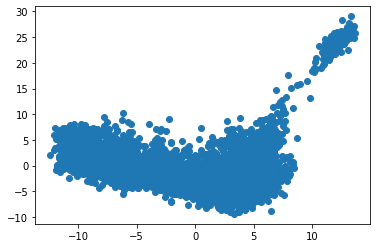

time: 297 ms (started: 2021-12-11 14:59:03 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec ACP

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(articles2_bert)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 58.7 s (started: 2021-12-11 14:59:03 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 7.55 ms (started: 2021-12-11 15:00:02 +00:00)


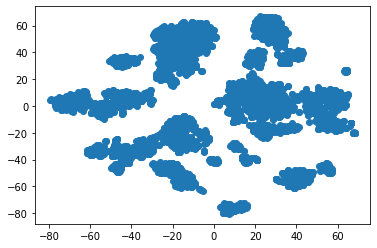

time: 262 ms (started: 2021-12-11 15:00:02 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec tSNE

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_bert)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


time: 44.3 s (started: 2021-12-11 15:00:02 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 4.91 ms (started: 2021-12-11 15:00:46 +00:00)


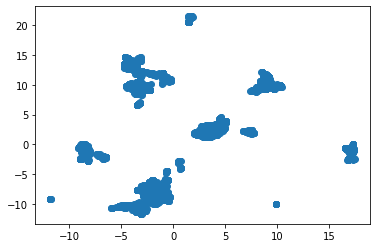

time: 236 ms (started: 2021-12-11 15:00:46 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut peut etre choisir k=4 ou k=5?

In [ ]:
X_reduced = autoencoder(articles2_bert.astype("float32"), 2, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:40<00:00,  1.23it/s]

time: 50.9 s (started: 2021-12-11 15:00:47 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 5.19 ms (started: 2021-12-11 15:01:37 +00:00)


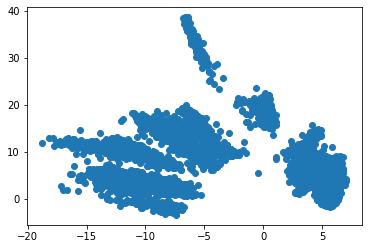

time: 235 ms (started: 2021-12-11 15:01:37 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut peut etre choisir k=5?

### Word2Vec

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_word2vec)

time: 125 ms (started: 2021-12-11 15:01:38 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 9.47 ms (started: 2021-12-11 15:01:38 +00:00)


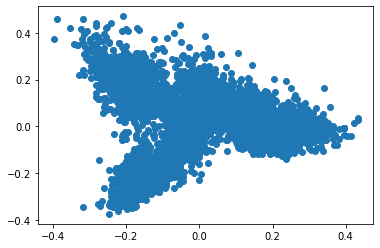

time: 228 ms (started: 2021-12-11 15:01:38 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec ACP

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(articles2_word2vec)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 55 s (started: 2021-12-11 15:01:38 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 5.02 ms (started: 2021-12-11 15:02:33 +00:00)


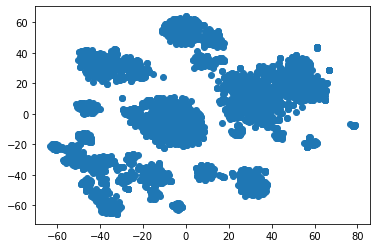

time: 285 ms (started: 2021-12-11 15:02:33 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec tSNE

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_word2vec)

time: 16.5 s (started: 2021-12-11 15:02:34 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 5.72 ms (started: 2021-12-11 15:02:50 +00:00)


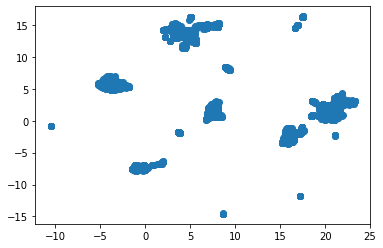

time: 239 ms (started: 2021-12-11 15:02:50 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec UMAP

In [ ]:
X_reduced = autoencoder(articles2_word2vec.astype("float32"), 2, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:11<00:00,  4.25it/s]

time: 11.8 s (started: 2021-12-11 15:02:50 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 5.32 ms (started: 2021-12-11 15:03:02 +00:00)


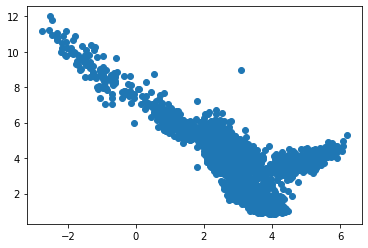

time: 220 ms (started: 2021-12-11 15:03:02 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec k'espace de l'autoencoder

### GloVe

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_glove)

time: 138 ms (started: 2021-12-11 15:03:02 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 4.92 ms (started: 2021-12-11 15:03:02 +00:00)


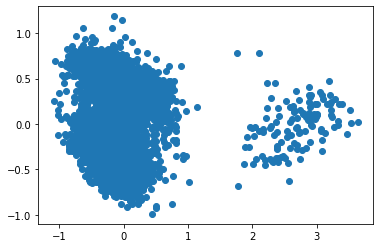

time: 253 ms (started: 2021-12-11 15:03:03 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut peut etre choisir k=2?

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(articles2_glove)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 54.4 s (started: 2021-12-11 15:03:03 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 7.96 ms (started: 2021-12-11 15:03:57 +00:00)


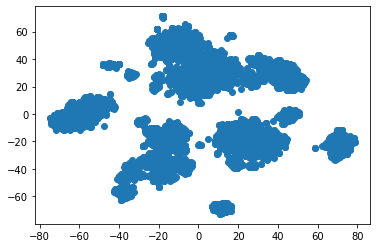

time: 272 ms (started: 2021-12-11 15:03:57 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec tSNE

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_glove)

time: 15.7 s (started: 2021-12-11 15:03:57 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 8.03 ms (started: 2021-12-11 15:04:13 +00:00)


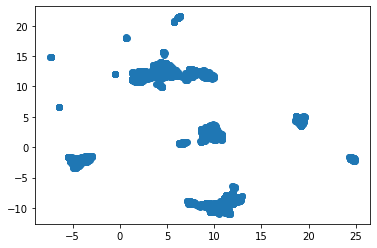

time: 245 ms (started: 2021-12-11 15:04:13 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec UMAP

In [ ]:
X_reduced = autoencoder(articles2_glove.astype("float32"), 2, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:12<00:00,  4.16it/s]

time: 12.1 s (started: 2021-12-11 15:04:13 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 4.44 ms (started: 2021-12-11 15:04:26 +00:00)


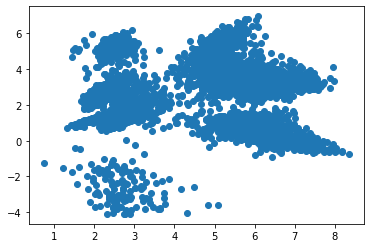

time: 257 ms (started: 2021-12-11 15:04:26 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec k'espace de l'autoencoder

### RoBerta

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_roberta)

time: 2.57 s (started: 2021-12-11 15:04:26 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 9.62 ms (started: 2021-12-11 15:04:28 +00:00)


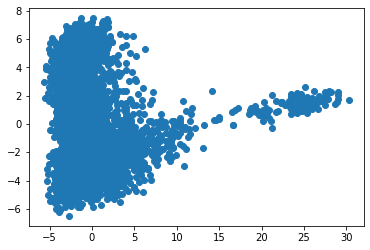

time: 253 ms (started: 2021-12-11 15:04:28 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec ACP

In [ ]:
X_reduced = TSNE(n_components=2, random_state=42).fit_transform(articles2_roberta)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


time: 59.6 s (started: 2021-12-11 15:04:29 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 4.2 ms (started: 2021-12-11 15:05:28 +00:00)


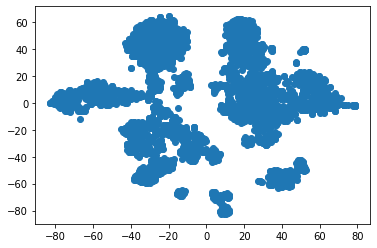

time: 252 ms (started: 2021-12-11 15:05:28 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec tSNE

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_roberta)

time: 21.4 s (started: 2021-12-11 15:05:29 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 5.83 ms (started: 2021-12-11 15:05:50 +00:00)


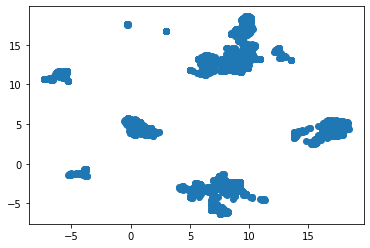

time: 213 ms (started: 2021-12-11 15:05:50 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut pas voir les classes directement avec UMAP

In [ ]:
X_reduced = autoencoder(articles2_roberta.astype("float32"), 2, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:59<00:00,  1.19s/it]

time: 59.8 s (started: 2021-12-11 15:05:50 +00:00)


In [ ]:
X_reduced.shape

(5089, 2)

time: 8.07 ms (started: 2021-12-11 15:06:50 +00:00)


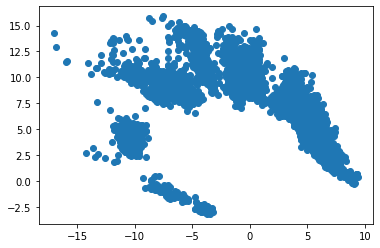

time: 264 ms (started: 2021-12-11 15:06:50 +00:00)


In [ ]:
plt.scatter(X_reduced[:,0], X_reduced[:,1])

on peut peut etre choisir k=6?

### Methode du coude

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_word2vec)

time: 82.6 ms (started: 2021-12-11 15:06:50 +00:00)


In [ ]:
from sklearn.metrics import silhouette_score

sse = {}
sil = {}
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(X_reduced)
    # data["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    sil[k] = silhouette_score(X_reduced, kmeans.labels_, metric = 'euclidean')

time: 4.7 s (started: 2021-12-11 15:06:50 +00:00)


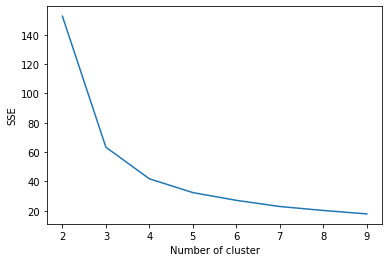

time: 194 ms (started: 2021-12-11 15:06:55 +00:00)


In [ ]:
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

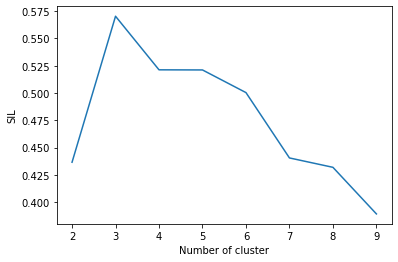

time: 228 ms (started: 2021-12-11 15:06:55 +00:00)


In [ ]:
plt.figure()
plt.plot(list(sil.keys()), list(sil.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SIL")
plt.show()

## La valeur optimale de K

La meilleure valeur pour K est 3, selon les méthodes coude + silhouette.

In [15]:
k_articles2 = 3

time: 732 µs (started: 2021-12-11 16:40:48 +00:00)


## word2vec

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_word2vec)
kmeans_labels = KMeans(k_articles2, random_state=42).fit(articles2_word2vec).labels_
spectral_labels = SpectralClustering(k_articles2, n_components= articles2_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(articles2_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(articles2_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_articles2).fit_predict(articles2_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_articles2, linkage="complete").fit_predict(articles2_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_articles2, linkage="average").fit_predict(articles2_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_articles2, linkage="single").fit_predict(articles2_word2vec)
gaussian = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_word2vec)

time: 1min (started: 2021-12-11 15:09:11 +00:00)


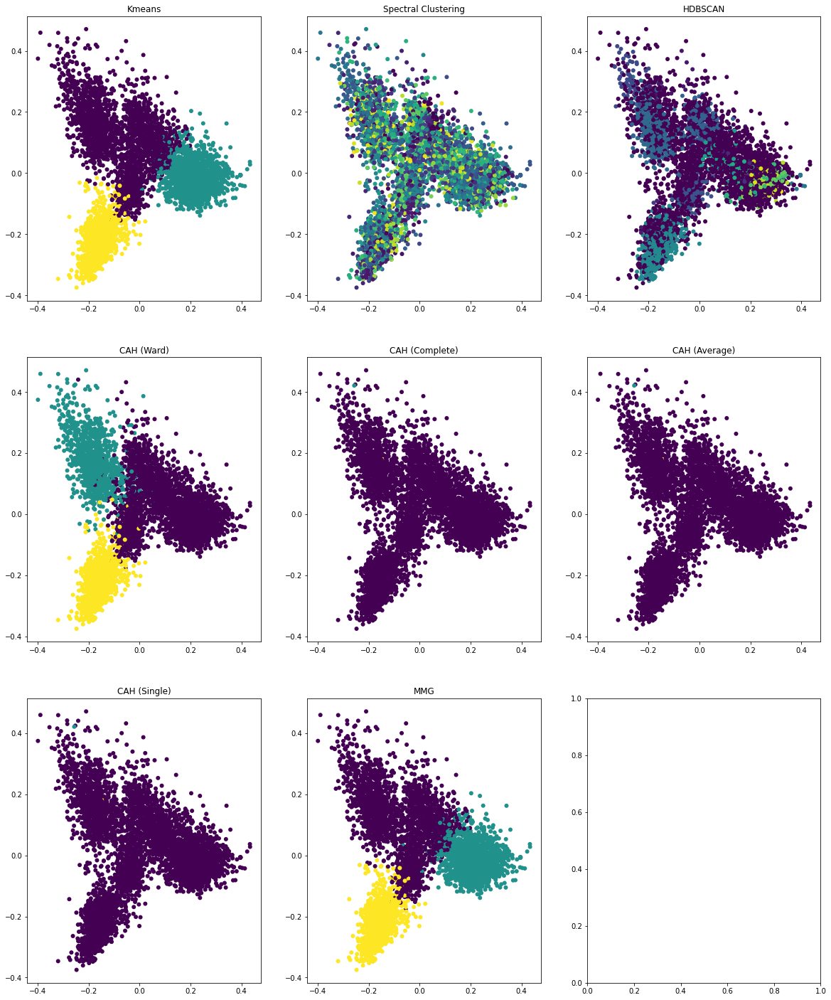

time: 2.3 s (started: 2021-12-11 15:10:11 +00:00)


In [ ]:
eval_clustering_2D(X_reduced, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

Nous pouvons voir que kmeans, CAH(Ward), et MMG convergent vers le même modèle alors que les autres ont des classifications aléatoires qui favorisent une des classes par rapport aux autres.

Nota: On va utiliser le nom de la mesure de dissimilarité comme equivalent au nom du modele sans perte de clarite dans ce qui suit

#### Espace Reduit

PCA avec 2 composantes

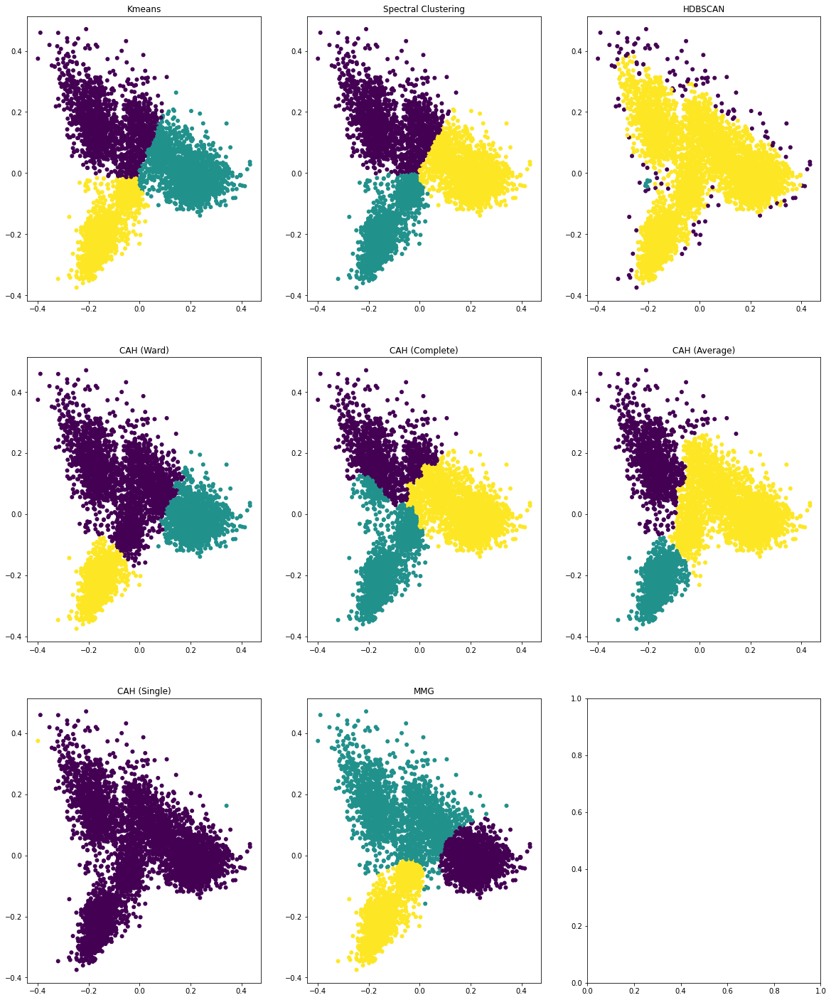

time: 9.45 s (started: 2021-12-11 15:12:16 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_word2vec)
run_clustering(X_reduced, k_articles2, True)

PCA avec 20 composantes

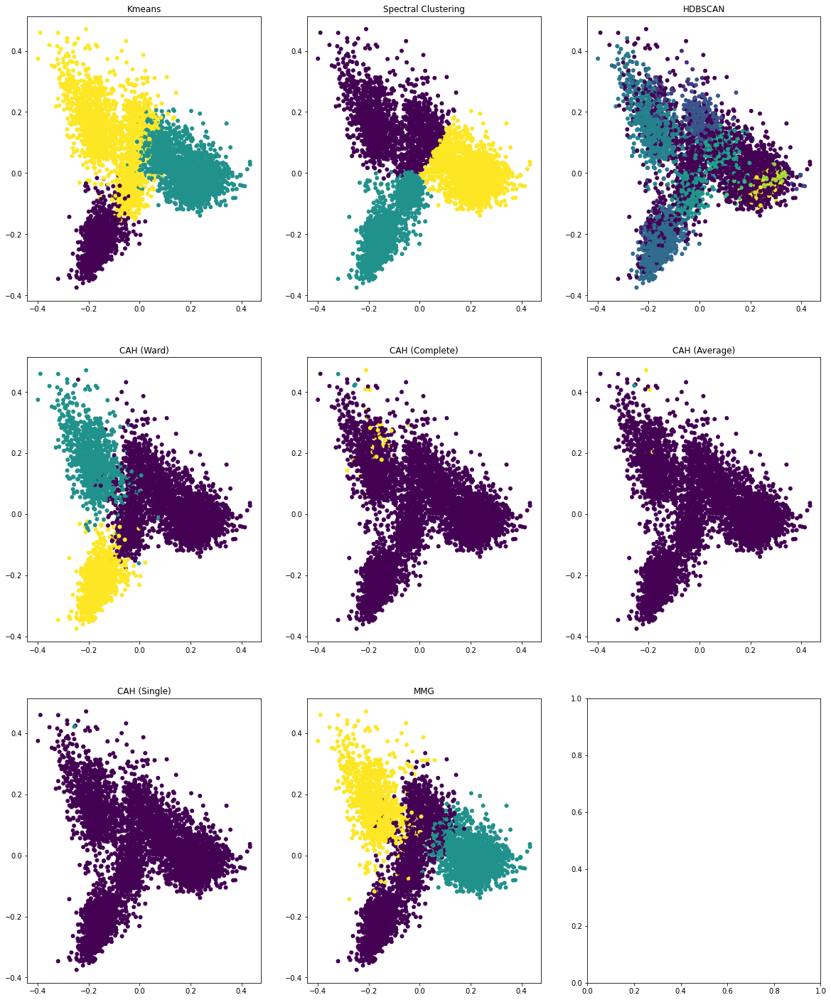

time: 12.2 s (started: 2021-12-11 15:12:25 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(articles2_word2vec)
run_clustering(X_reduced, k_articles2, True)

- Nous pouvons voir que l'utilisation d'une ACP à 2 ou 20 composantes fait converger le clustering spectral et maximum vers le même modèle que kmeans, Ward et MMG. 

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


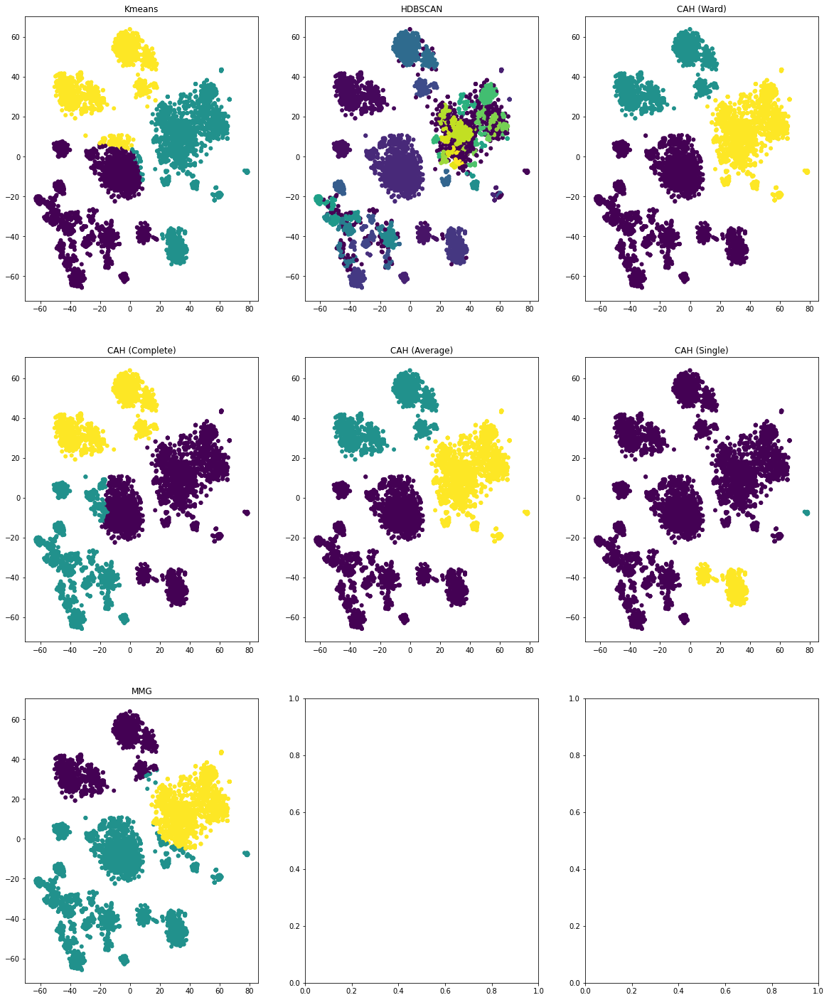

time: 60 s (started: 2021-12-11 15:12:43 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(articles2_word2vec)
run_clustering(X_reduced_tsne, k_articles2)

- Nous pouvons voir que l'utilisation d'une tSNE fait converger kmeans, Ward, Average et MMG vers le même modèle. 

UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_word2vec)

time: 15.9 s (started: 2021-12-11 15:13:43 +00:00)


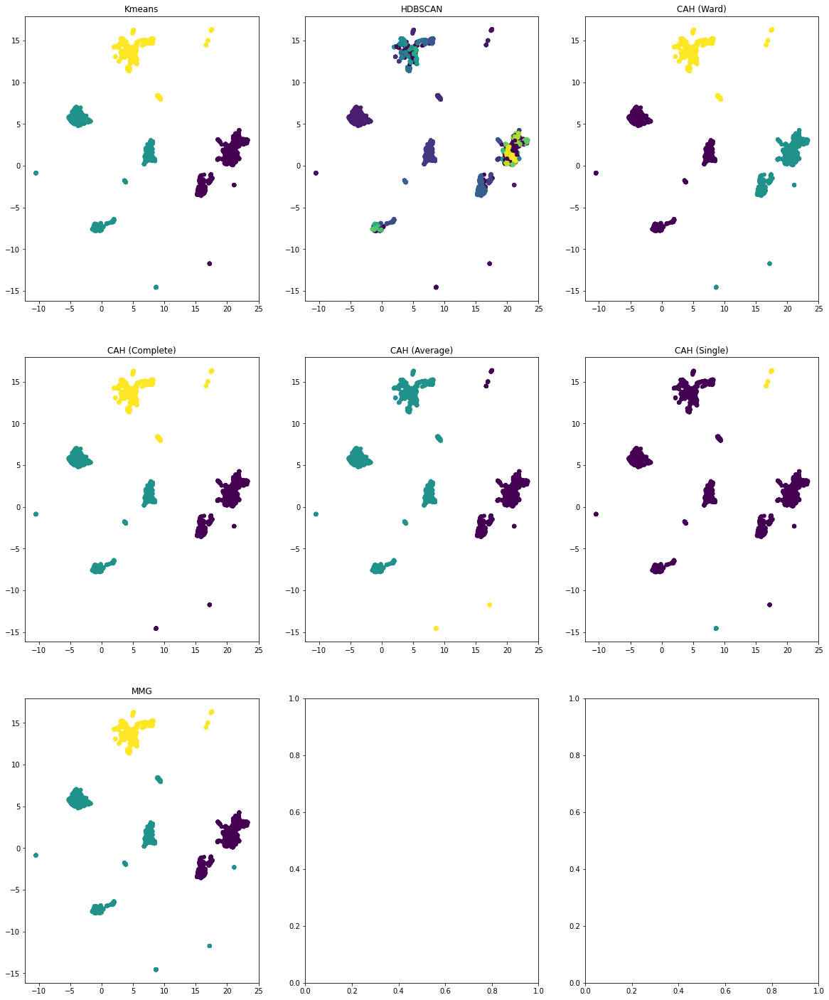

time: 4.25 s (started: 2021-12-11 15:16:46 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'UMAP fait converger kmeans, Ward, Maximum et MMG vers approximativement le même modèle.
On va prendre celui de MMG comme reference

Autoencoder

In [ ]:
n_components=2
X_reduced = autoencoder(articles2_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:11<00:00,  4.19it/s]

time: 12 s (started: 2021-12-11 15:16:52 +00:00)


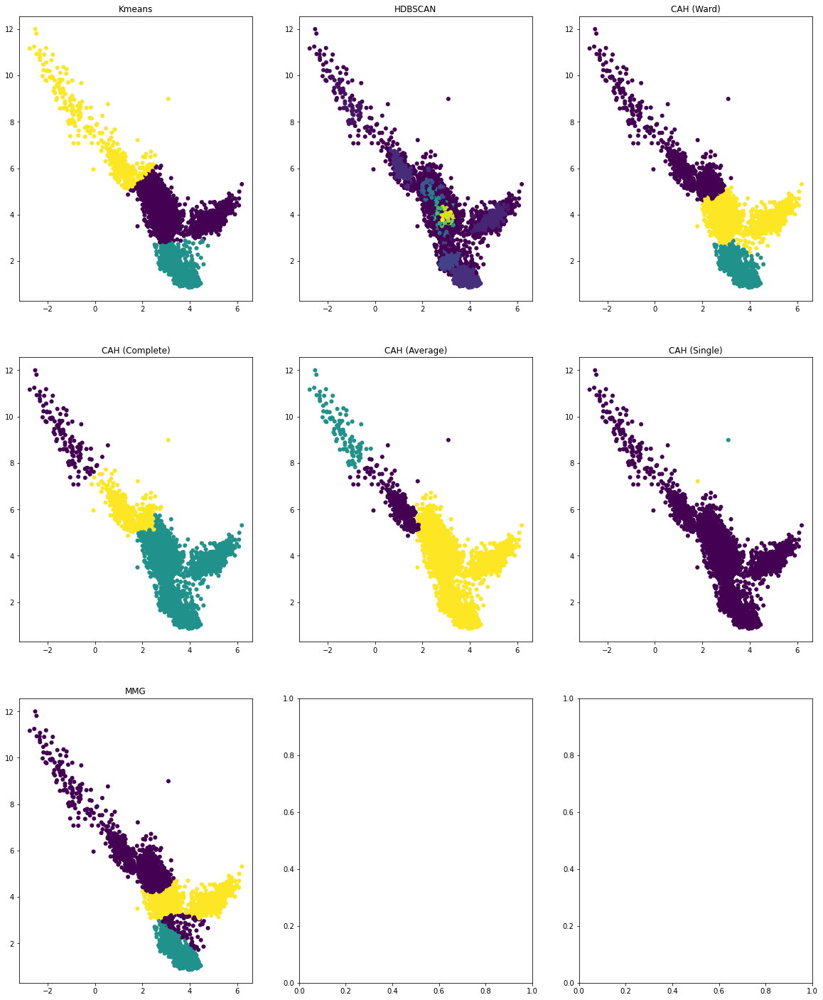

time: 4.62 s (started: 2021-12-11 15:17:04 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2,)

- Nous pouvons voir que l'utilisation de l'espace d'un autoencoder fait converger kmeans, Ward, Maximum, Moyenne et MMG vers approximativement le même modèle. 

#### Interpretations des resultats 

In [ ]:

pca_space = PCA(n_components=2, random_state=42).fit_transform(articles2_word2vec)

tsne_space = TSNE(n_components=2, random_state=42).fit_transform(articles2_word2vec)

umap_space = UMAP(n_components=2, random_state=42).fit_transform(articles2_word2vec)

autoencoder_space = autoencoder(articles2_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:11<00:00,  4.17it/s]

time: 1min 22s (started: 2021-12-11 15:17:08 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 44.7 ms (started: 2021-12-11 15:18:31 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 1


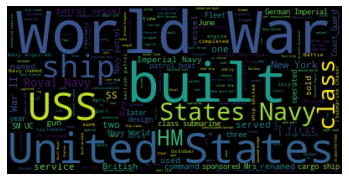



Class: 0


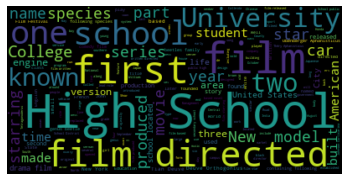



Class: 2


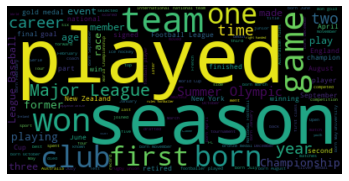



time: 7.41 s (started: 2021-12-11 15:18:31 +00:00)


In [ ]:
original_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_word2vec)
print_wordcloud(texts, original_labels)

Class: 0


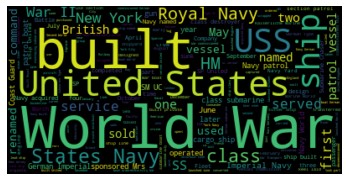



Class: 1


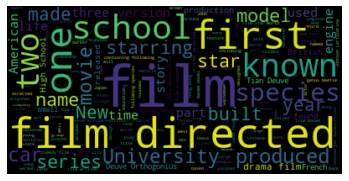



Class: 2


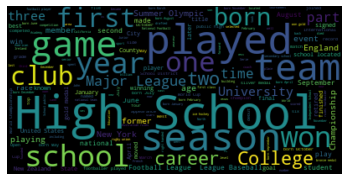



time: 4.14 s (started: 2021-12-11 15:18:38 +00:00)


In [ ]:
pca_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(pca_space)
print_wordcloud(texts, pca_labels)

Class: 2


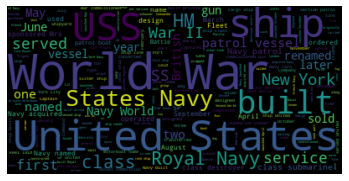



Class: 1


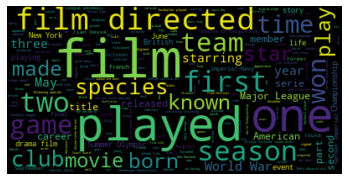



Class: 0


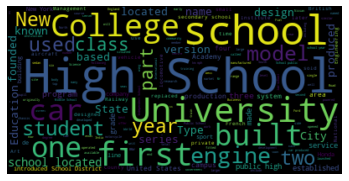



time: 4.19 s (started: 2021-12-11 15:18:42 +00:00)


In [ ]:
tsne_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(tsne_space)
print_wordcloud(texts, tsne_labels)

Class: 0


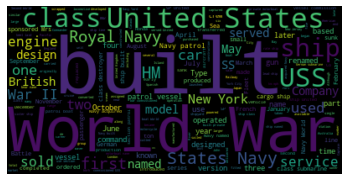



Class: 1


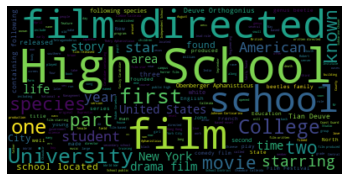



Class: 2


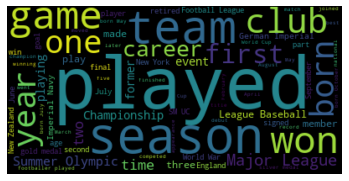



time: 3.9 s (started: 2021-12-11 15:18:47 +00:00)


In [ ]:
umap_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(umap_space)
print_wordcloud(texts, umap_labels)

Class: 0


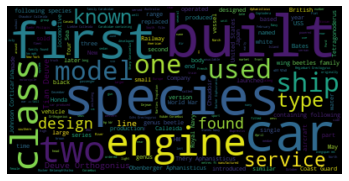



Class: 1


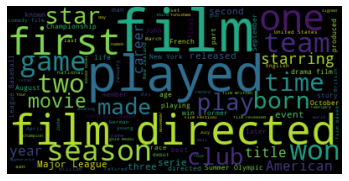



Class: 2


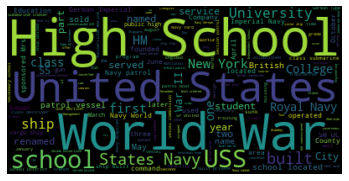



time: 3.84 s (started: 2021-12-11 15:18:50 +00:00)


In [ ]:
autoencoder_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(autoencoder_space)
print_wordcloud(texts, autoencoder_labels)

Nous pouvons voir que tous les meilleurs modèles, chacun provenant des modèles de chaque technique de réduction de la dimensionnalité, ont tous approximativement la même classification.

## glove

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_glove)
kmeans_labels = KMeans(k_articles2, random_state=42).fit(articles2_glove).labels_
spectral_labels = SpectralClustering(k_articles2, n_components= articles2_glove.shape[1], assign_labels="discretize", random_state=42).fit(articles2_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(articles2_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_articles2).fit_predict(articles2_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_articles2, linkage="complete").fit_predict(articles2_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_articles2, linkage="average").fit_predict(articles2_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_articles2, linkage="single").fit_predict(articles2_glove)
gaussian = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_glove)

time: 1min 38s (started: 2021-12-11 15:18:54 +00:00)


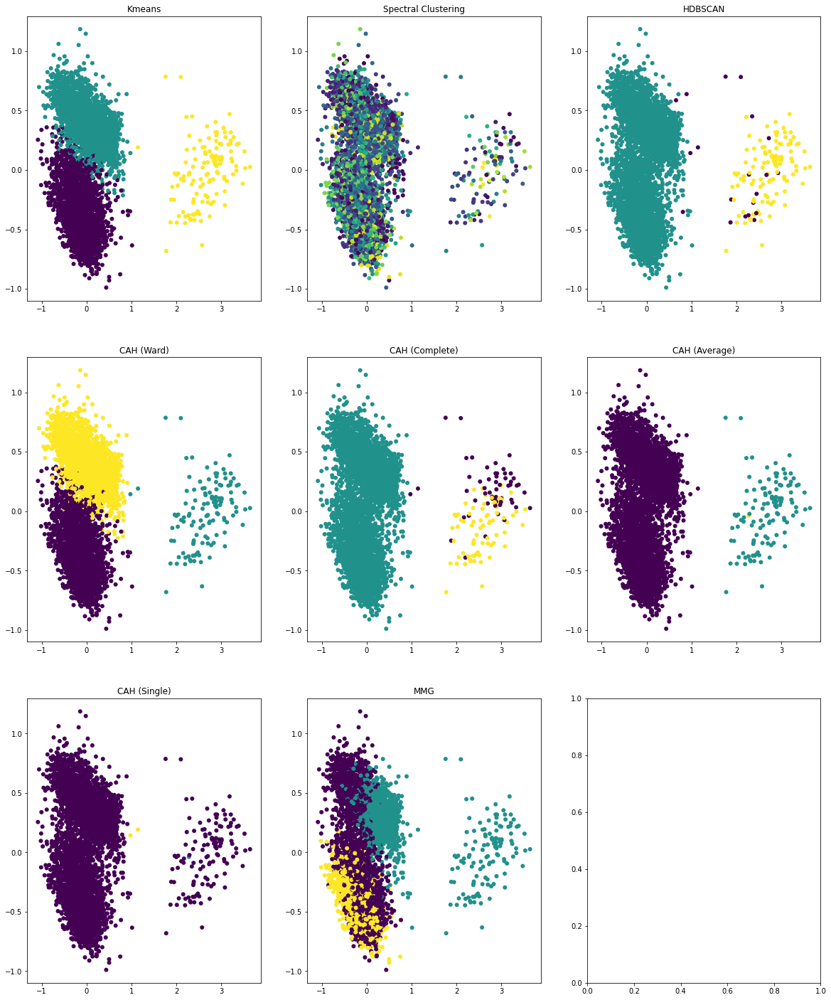

time: 1.81 s (started: 2021-12-11 15:20:32 +00:00)


In [ ]:
eval_clustering_2D(X_reduced, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

Nous pouvons voir que kmeans, CAH(Ward), et MMG convergent vers le même modèle alors que les autres ont des classifications aléatoires qui favorisent une des classes par rapport aux autres.

Nota: On va utiliser le nom de la mesure de dissimilarité comme equivalent au nom du modele sans perte de clarite dans ce qui suit

#### Espace Reduit

PCA avec 2 composantes

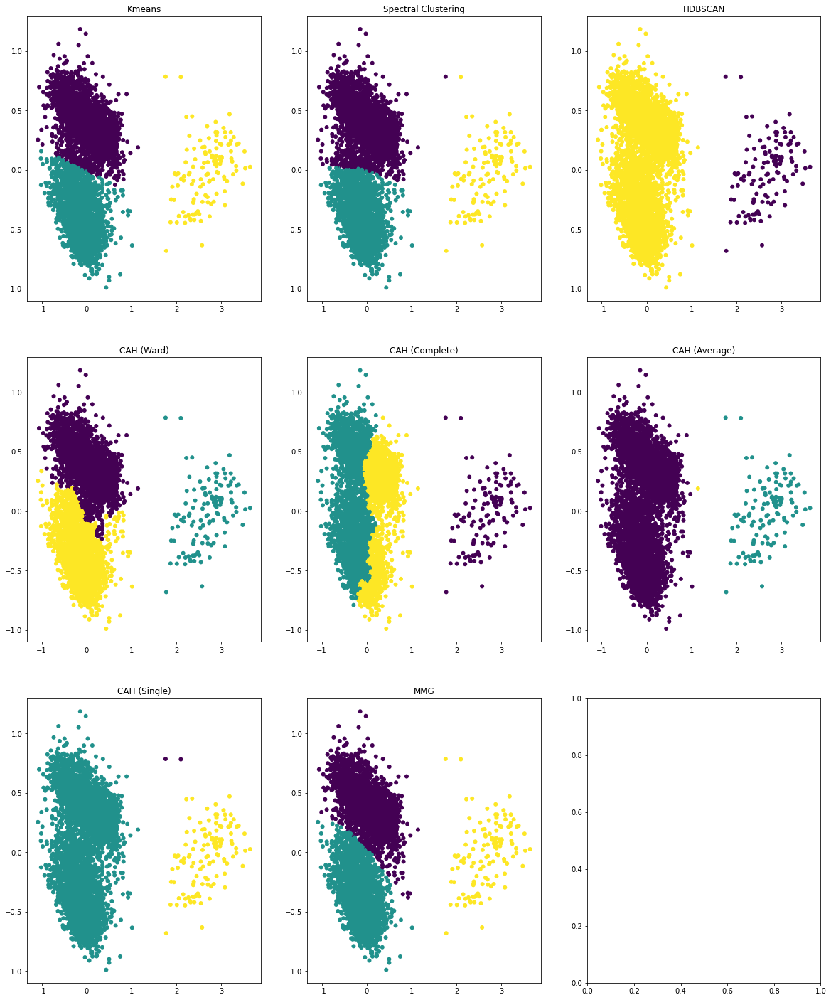

time: 9.59 s (started: 2021-12-11 15:20:34 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_glove)
run_clustering(X_reduced, k_articles2, True)

PCA avec 20 composantes

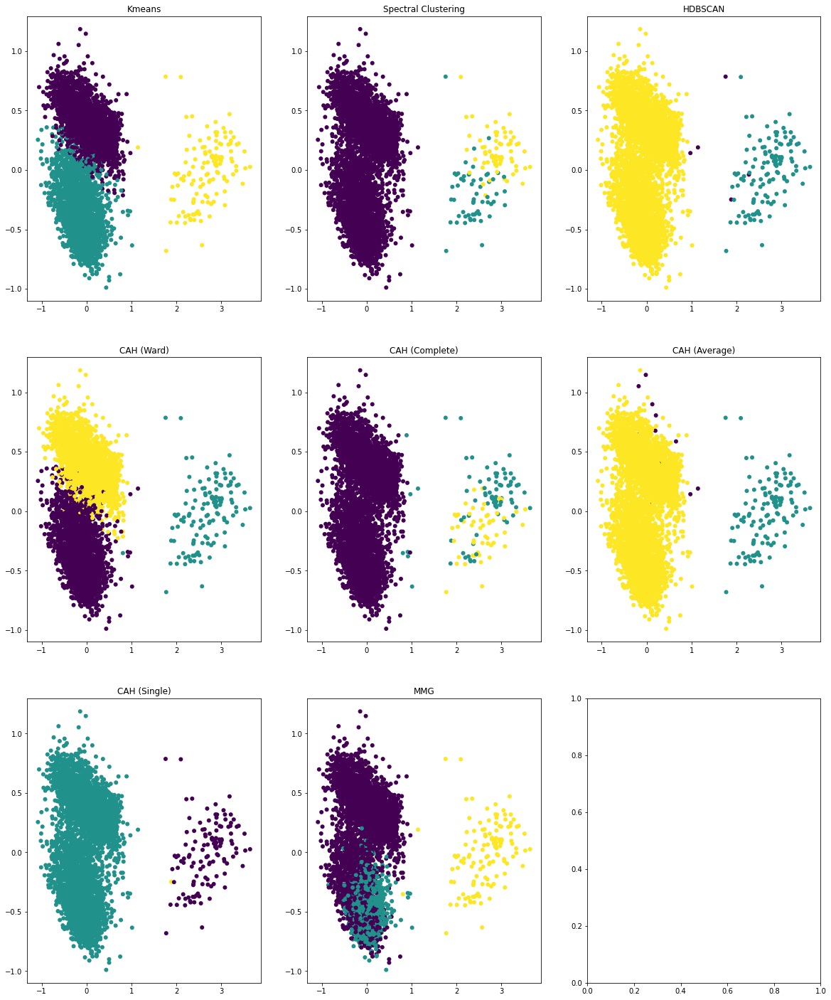

time: 11.5 s (started: 2021-12-11 15:20:44 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(articles2_glove)
run_clustering(X_reduced, k_articles2, True)

- Nous pouvons voir que l'utilisation d'une ACP à 2 composantes fait converger le clustering spectral vers le même modèle que kmeans, Ward et MMG. 

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


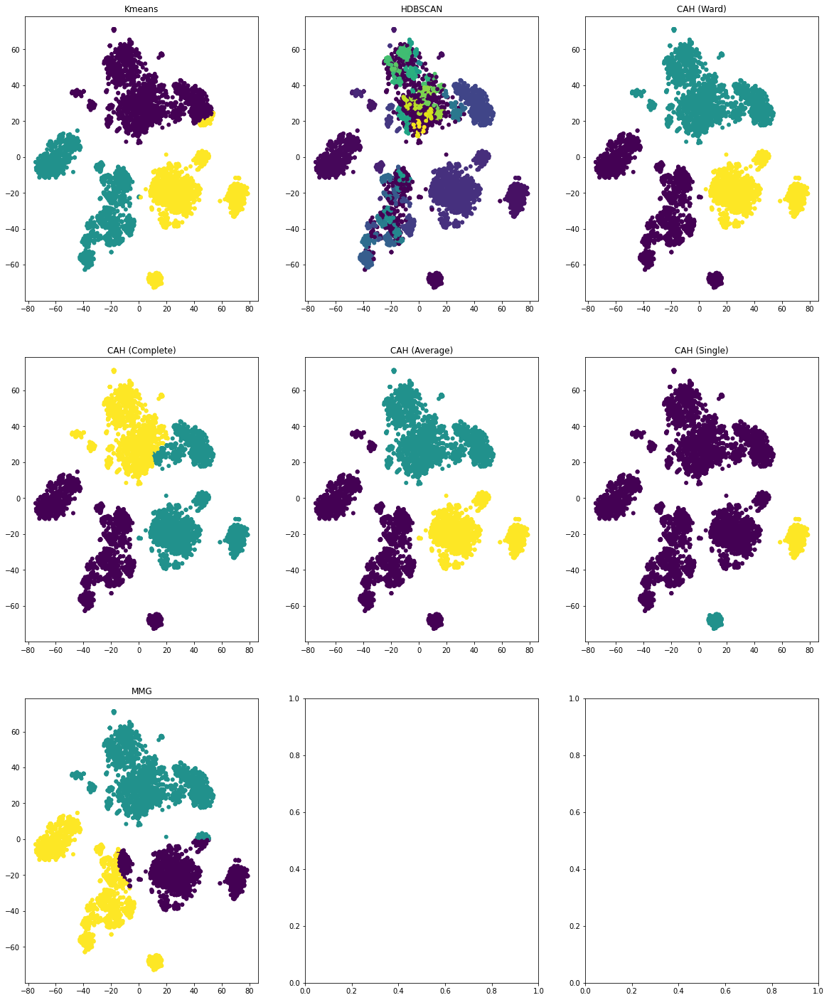

time: 57.8 s (started: 2021-12-11 15:20:55 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(articles2_glove)
run_clustering(X_reduced_tsne, k_articles2)

- Nous pouvons voir que l'utilisation d'une tSNE fait converger kmeans, Ward et MMG vers le même modèle. 

UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_glove)

time: 16 s (started: 2021-12-11 15:21:53 +00:00)


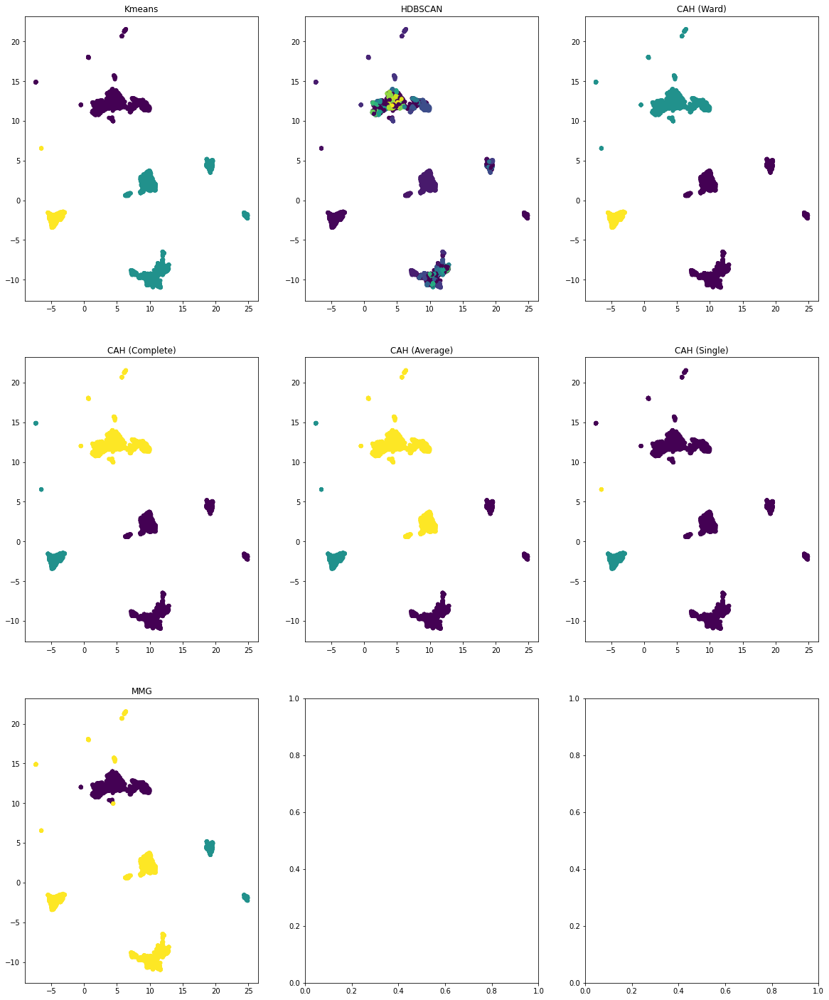

time: 4.1 s (started: 2021-12-11 15:22:09 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'UMAP fait converger Kmeans, Ward et MMG vers approximativement le même modèle.
On va prendre celui de Ward comme reference

Autoencoder

In [ ]:
n_components=2
X_reduced = autoencoder(articles2_glove.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:11<00:00,  4.25it/s]

time: 11.8 s (started: 2021-12-11 15:22:13 +00:00)


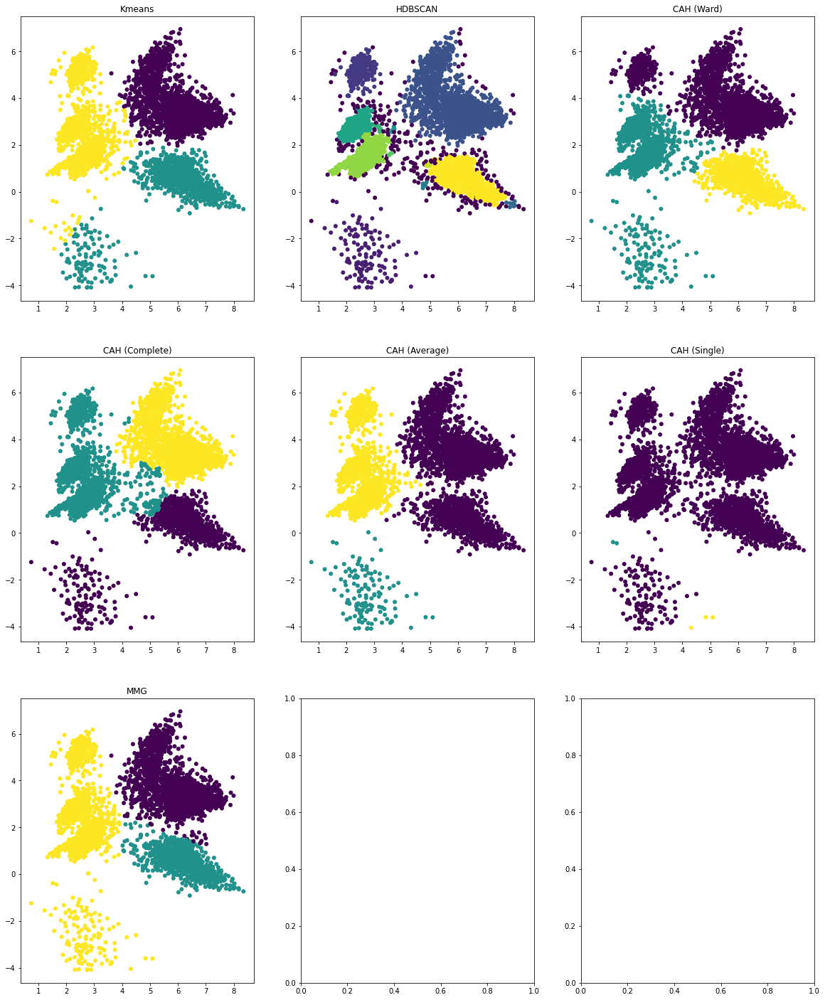

time: 4.24 s (started: 2021-12-11 15:22:26 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation de l'espace d'un autoencoder fait converger Kmeans, Spectral Clustering, Ward, Maximum, et MMG vers approximativement le même modèle. 

#### Interpretations des resultats 

In [ ]:

pca_space = PCA(n_components=2, random_state=42).fit_transform(articles2_glove)

tsne_space = TSNE(n_components=2, random_state=42).fit_transform(articles2_glove)

umap_space = UMAP(n_components=2, random_state=42).fit_transform(articles2_glove)

autoencoder_space = autoencoder(articles2_glove.astype("float32"), n_components, seed=42, learning_rate=1e-3)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:11<00:00,  4.26it/s]

time: 1min 21s (started: 2021-12-11 15:22:31 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 6.67 ms (started: 2021-12-11 15:23:52 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 1


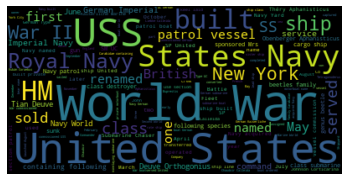



Class: 2


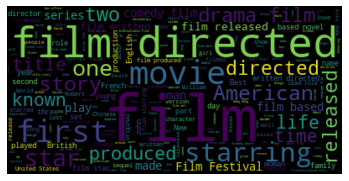



Class: 0


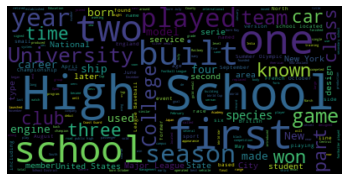



time: 10 s (started: 2021-12-11 15:23:52 +00:00)


In [ ]:
original_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_glove)
print_wordcloud(texts, original_labels)

Class: 0


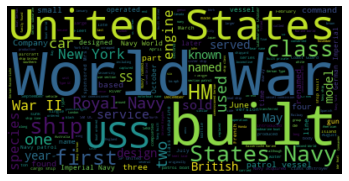



Class: 1


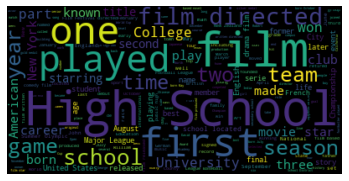



Class: 2


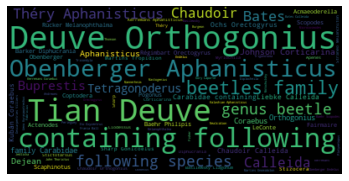



time: 4.1 s (started: 2021-12-11 15:24:02 +00:00)


In [ ]:
pca_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(pca_space)
print_wordcloud(texts, pca_labels)

Class: 1


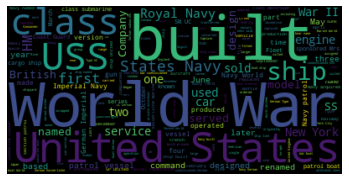



Class: 0


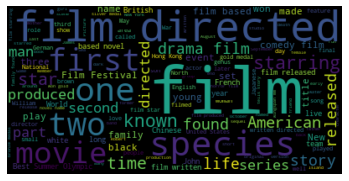



Class: 2


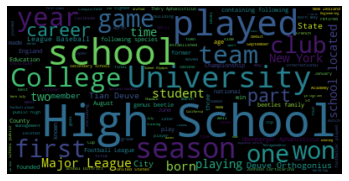



time: 3.97 s (started: 2021-12-11 15:24:06 +00:00)


In [ ]:
tsne_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(tsne_space)
print_wordcloud(texts, tsne_labels)

Class: 1


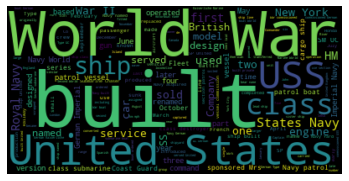



Class: 0


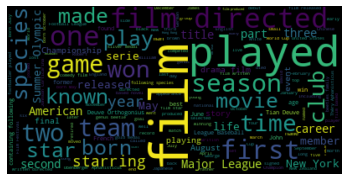



Class: 2


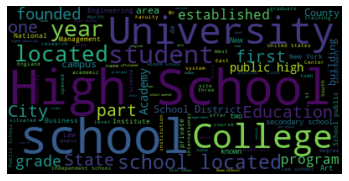



time: 4.62 s (started: 2021-12-11 15:24:10 +00:00)


In [ ]:
umap_labels = AgglomerativeClustering(n_clusters=k_articles2).fit_predict(umap_space)
print_wordcloud(texts, umap_labels)

Class: 0


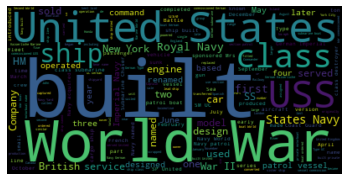



Class: 2


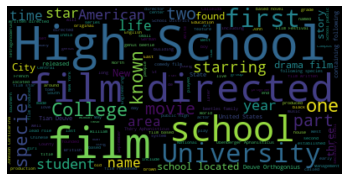



Class: 1


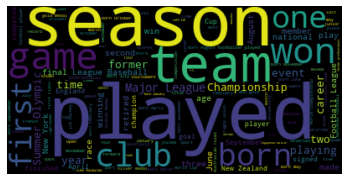



time: 3.99 s (started: 2021-12-11 15:24:15 +00:00)


In [ ]:
autoencoder_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(autoencoder_space)
print_wordcloud(texts, autoencoder_labels)

Nous pouvons voir que tous les meilleurs modèles, chacun provenant des modèles de chaque technique de réduction de la dimensionnalité, ont tous approximativement la même classification.

## bert

#### Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_bert)
kmeans_labels = KMeans(k_articles2, random_state=42).fit(articles2_bert).labels_
# spectral_labels = SpectralClustering(k_articles2, n_components= articles2_bert.shape[1], assign_labels="discretize", random_state=42).fit(articles2_bert).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(articles2_bert).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_articles2).fit_predict(articles2_bert)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_articles2, linkage="complete").fit_predict(articles2_bert)
cah_labels_average = AgglomerativeClustering(n_clusters=k_articles2, linkage="average").fit_predict(articles2_bert)
cah_labels_single = AgglomerativeClustering(n_clusters=k_articles2, linkage="single").fit_predict(articles2_bert)
gaussian = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_bert)

time: 30min 30s (started: 2021-12-11 15:24:19 +00:00)


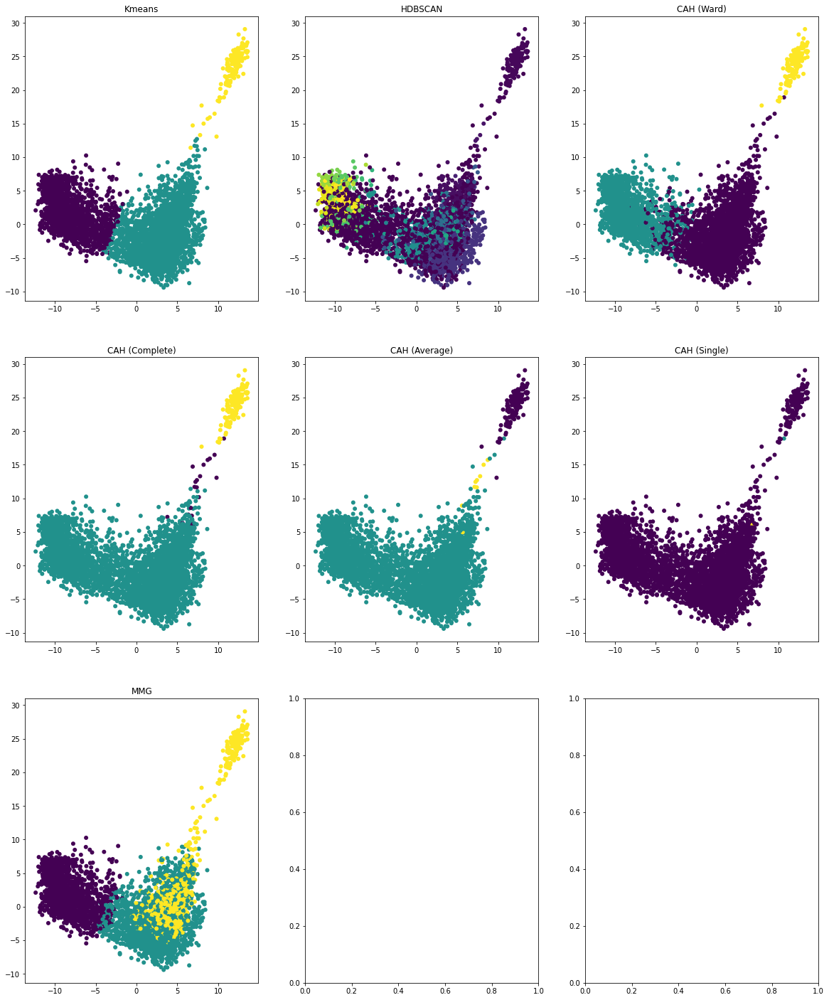

time: 2.5 s (started: 2021-12-11 15:54:49 +00:00)


In [ ]:
eval_clustering_2D(X_reduced, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

Nous pouvons voir que kmeans, CAH(Ward), et MMG convergent vers le même modèle alors que les autres ont des classifications aléatoires qui favorisent une des classes par rapport aux autres.

Nota: On va utiliser le nom de la mesure de dissimilarité comme equivalent au nom du modele sans perte de clarite dans ce qui suit

#### Espace Reduit

PCA avec 2 composantes

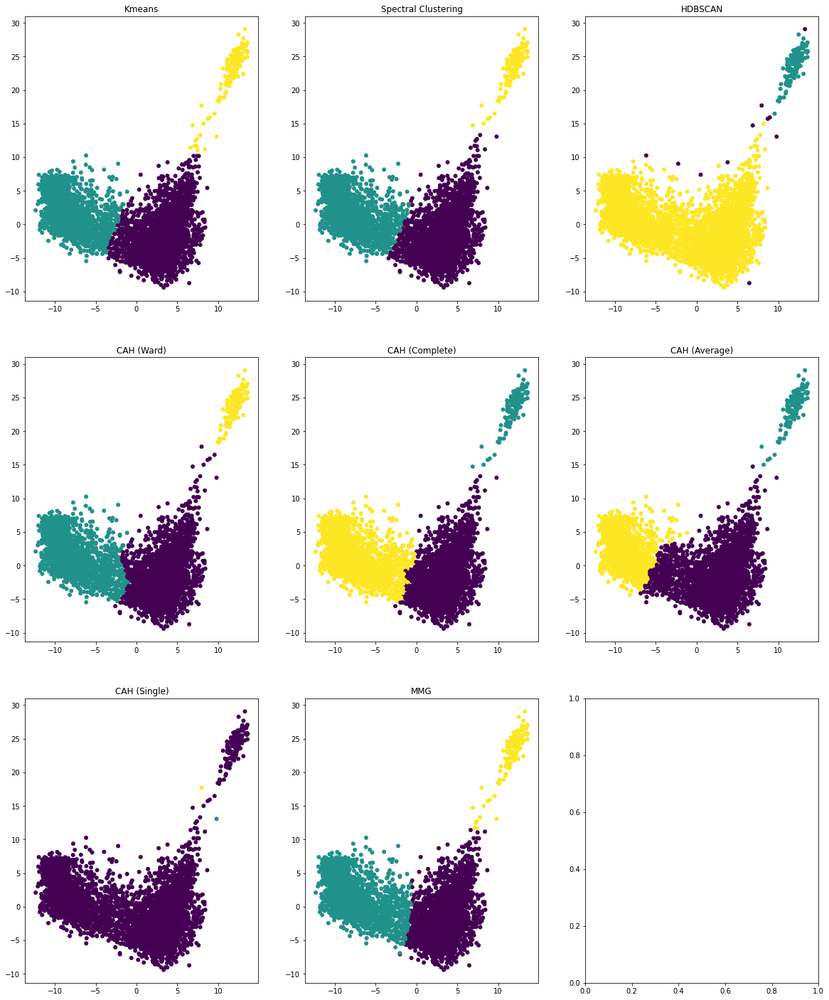

time: 16.1 s (started: 2021-12-11 15:55:26 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_bert)
run_clustering(X_reduced, k_articles2, True)

PCA avec 20 composantes

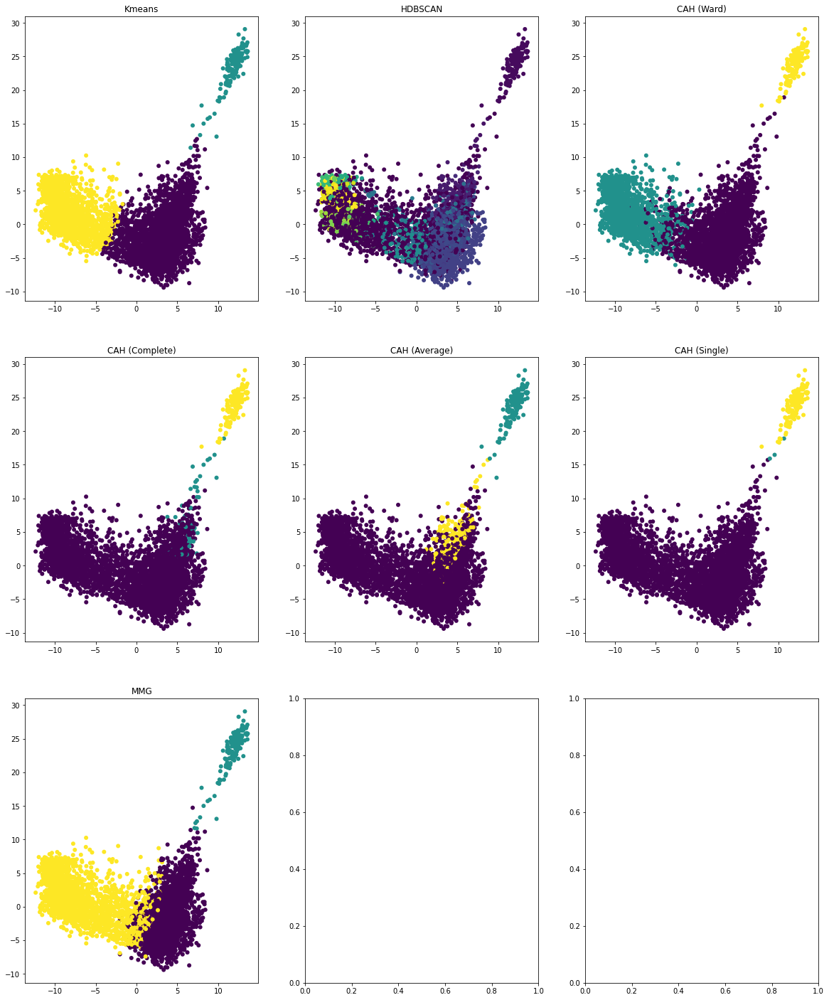

time: 9.61 s (started: 2021-12-11 15:55:42 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(articles2_bert)
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'une ACP à 2 composantes fait converger kmeans, Ward, maximum, moyenne et MMG vers le même modèle. 

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


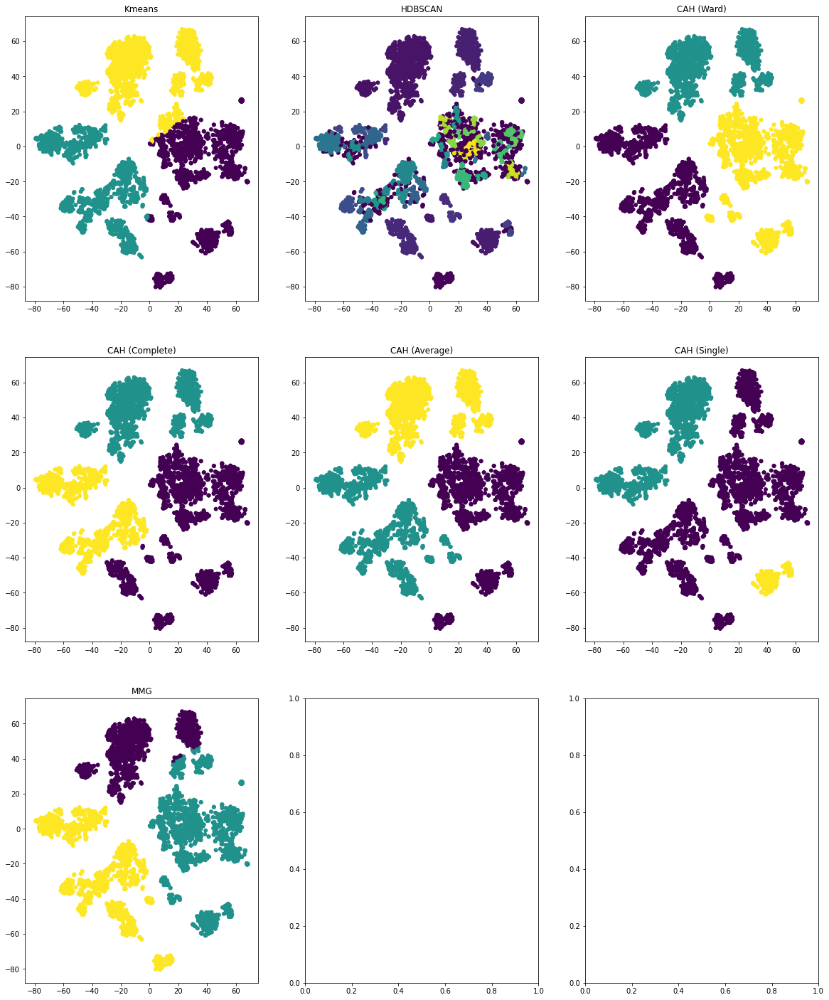

time: 1min 3s (started: 2021-12-11 15:55:52 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(articles2_bert)
run_clustering(X_reduced_tsne, k_articles2)

- Nous pouvons voir que l'utilisation d'une tSNE fait converger kmeans, Ward, Maximum, et MMG vers le même modèle. 

UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_bert)

time: 22.1 s (started: 2021-12-11 15:56:55 +00:00)


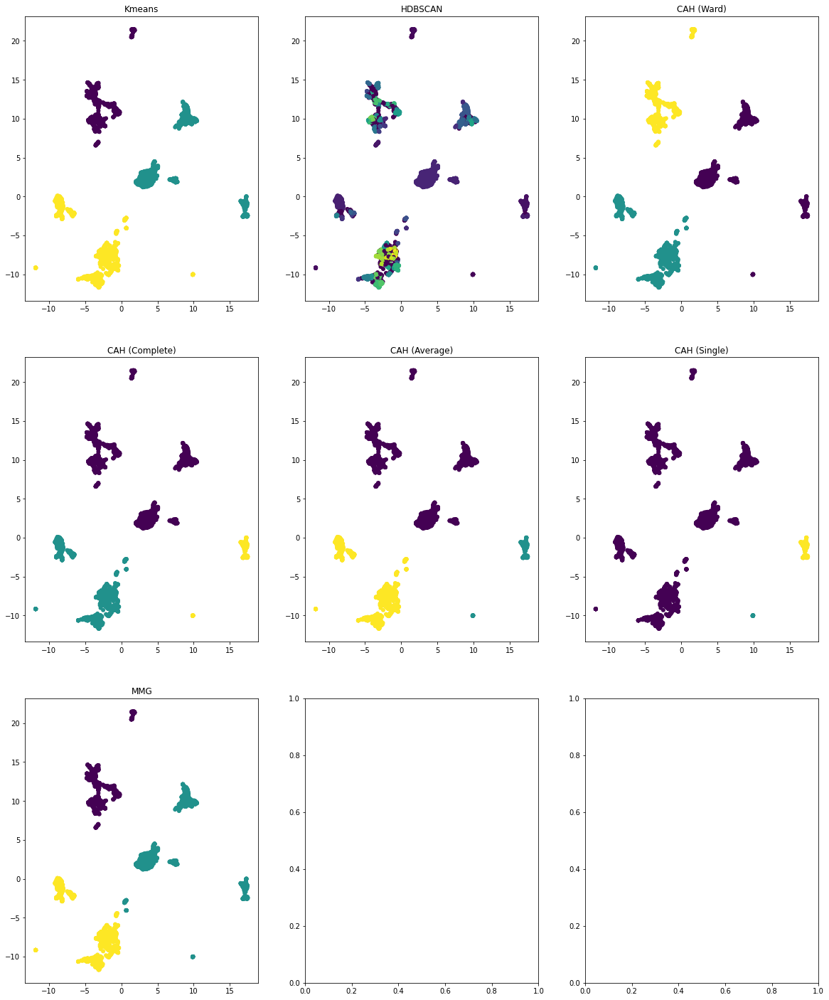

time: 4.49 s (started: 2021-12-11 15:57:17 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'UMAP fait converger kmeans et Ward vers le même modèle.
- MMG est un model qui s'approche a celui de kmeans et ward. 
- On va tester les 2 avec le wordcloud

Autoencoder

In [ ]:
n_components=2
X_reduced = autoencoder(articles2_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [01:07<00:00,  1.36s/it]

time: 1min 8s (started: 2021-12-11 15:57:22 +00:00)


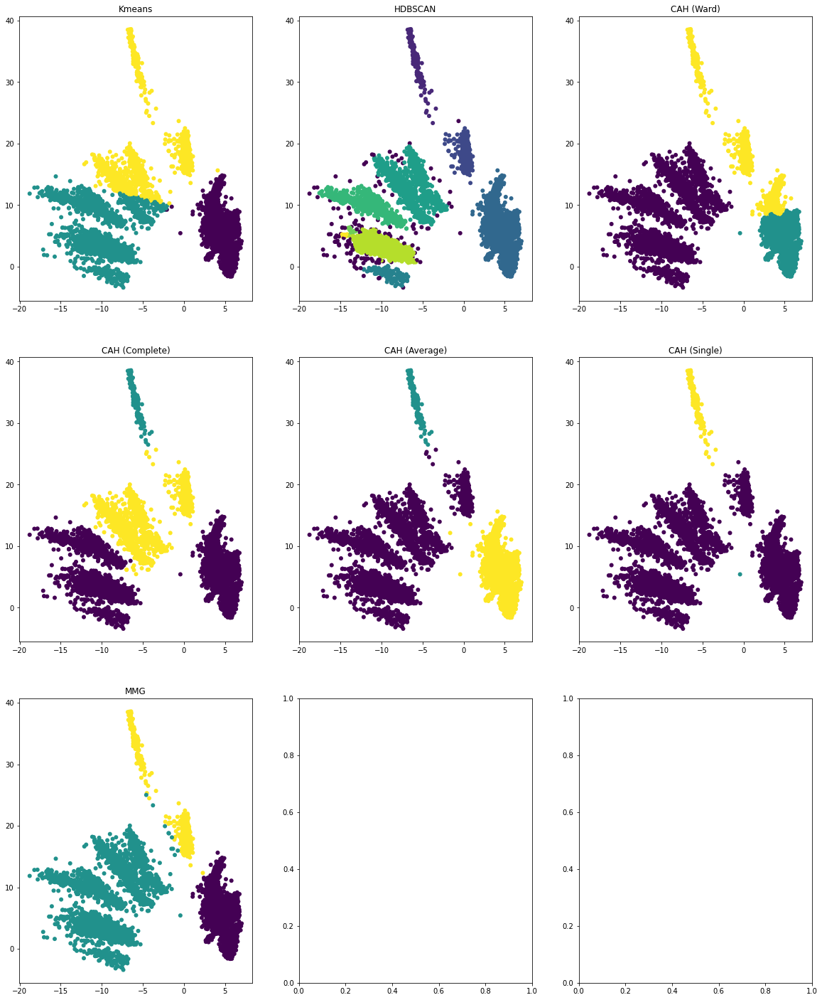

time: 4.74 s (started: 2021-12-11 15:58:30 +00:00)


In [ ]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation de l'espace d'un autoencoder fait converger  Ward,et MMG vers approximativement le même modèle. 

#### Interpretations des resultats 

In [ ]:

pca_space = PCA(n_components=2, random_state=42).fit_transform(articles2_bert)

tsne_space = TSNE(n_components=2, random_state=42).fit_transform(articles2_bert)

umap_space = UMAP(n_components=2, random_state=42).fit_transform(articles2_bert)

autoencoder_space = autoencoder(articles2_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:47<00:00,  1.06it/s]

time: 2min 10s (started: 2021-12-11 15:58:35 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 8.84 ms (started: 2021-12-11 16:00:45 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 0


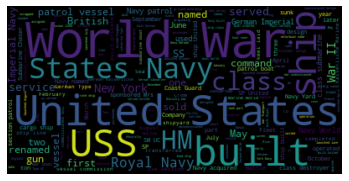



Class: 1


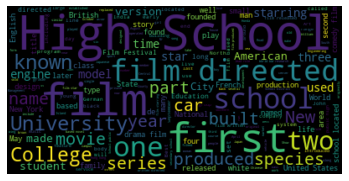



Class: 2


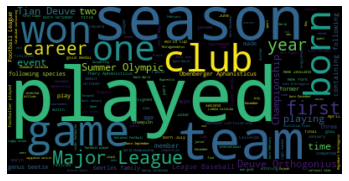



time: 4.16 s (started: 2021-12-11 16:00:45 +00:00)


In [ ]:
original_labels = gaussian
print_wordcloud(texts, original_labels)

Class: 1


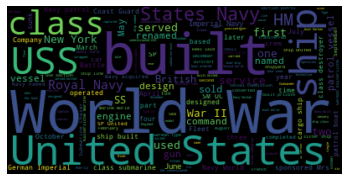



Class: 0


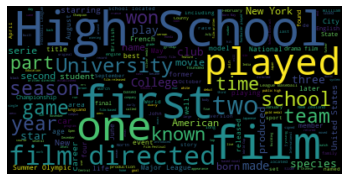



Class: 2


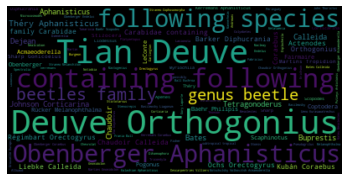



time: 4.17 s (started: 2021-12-11 16:00:50 +00:00)


In [ ]:
pca_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(pca_space)
print_wordcloud(texts, pca_labels)

Class: 1


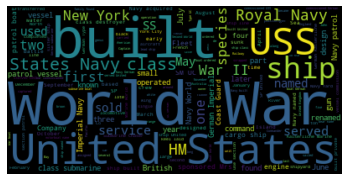



Class: 0


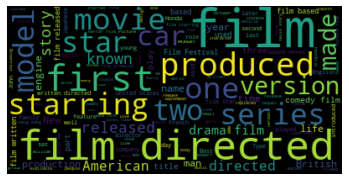



Class: 2


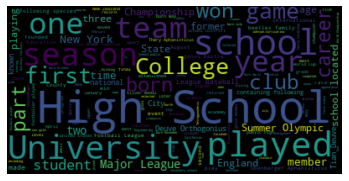



time: 4.06 s (started: 2021-12-11 16:00:54 +00:00)


In [ ]:
tsne_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(tsne_space)
print_wordcloud(texts, tsne_labels)

Class: 2


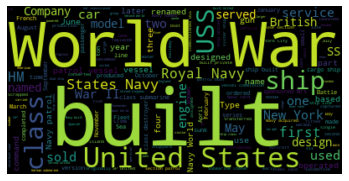



Class: 1


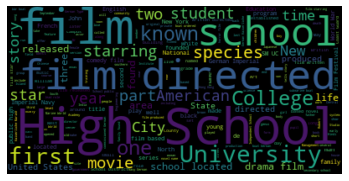



Class: 0


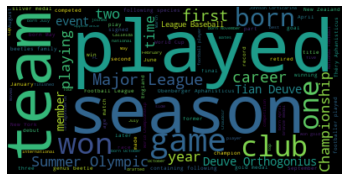



time: 4.01 s (started: 2021-12-11 16:00:58 +00:00)


In [ ]:
umap_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(umap_space)
print_wordcloud(texts, umap_labels)

Class: 0


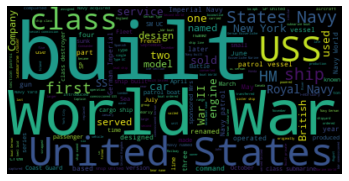



Class: 1


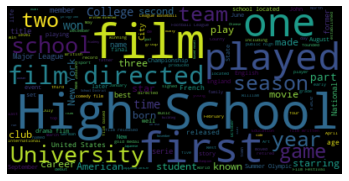



Class: 2


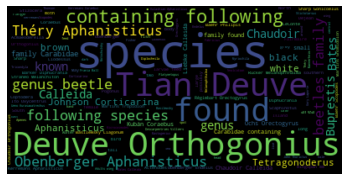



time: 4.09 s (started: 2021-12-11 16:01:02 +00:00)


In [ ]:
autoencoder_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(autoencoder_space)
print_wordcloud(texts, autoencoder_labels)

Nous pouvons voir que tous les meilleurs modèles, chacun provenant des modèles de chaque technique de réduction de la dimensionnalité, ont tous approximativement la même classification.

## roberta

#### Espace Original

In [29]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_roberta)
kmeans_labels = KMeans(k_articles2, random_state=42).fit(articles2_roberta).labels_
# spectral_labels = SpectralClustering(k_articles2, n_components= articles2_roberta.shape[1], assign_labels="discretize", random_state=42).fit(articles2_roberta).labels_
# hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(articles2_roberta).labels_


time: 20.4 s (started: 2021-12-11 16:46:19 +00:00)


In [30]:
cah_labels_ward = AgglomerativeClustering(n_clusters=k_articles2).fit_predict(articles2_roberta)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_articles2, linkage="complete").fit_predict(articles2_roberta)
cah_labels_average = AgglomerativeClustering(n_clusters=k_articles2, linkage="average").fit_predict(articles2_roberta)
cah_labels_single = AgglomerativeClustering(n_clusters=k_articles2, linkage="single").fit_predict(articles2_roberta)

time: 8min 6s (started: 2021-12-11 16:46:40 +00:00)


In [31]:
gaussian = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(articles2_roberta)

time: 14min 38s (started: 2021-12-11 16:54:46 +00:00)


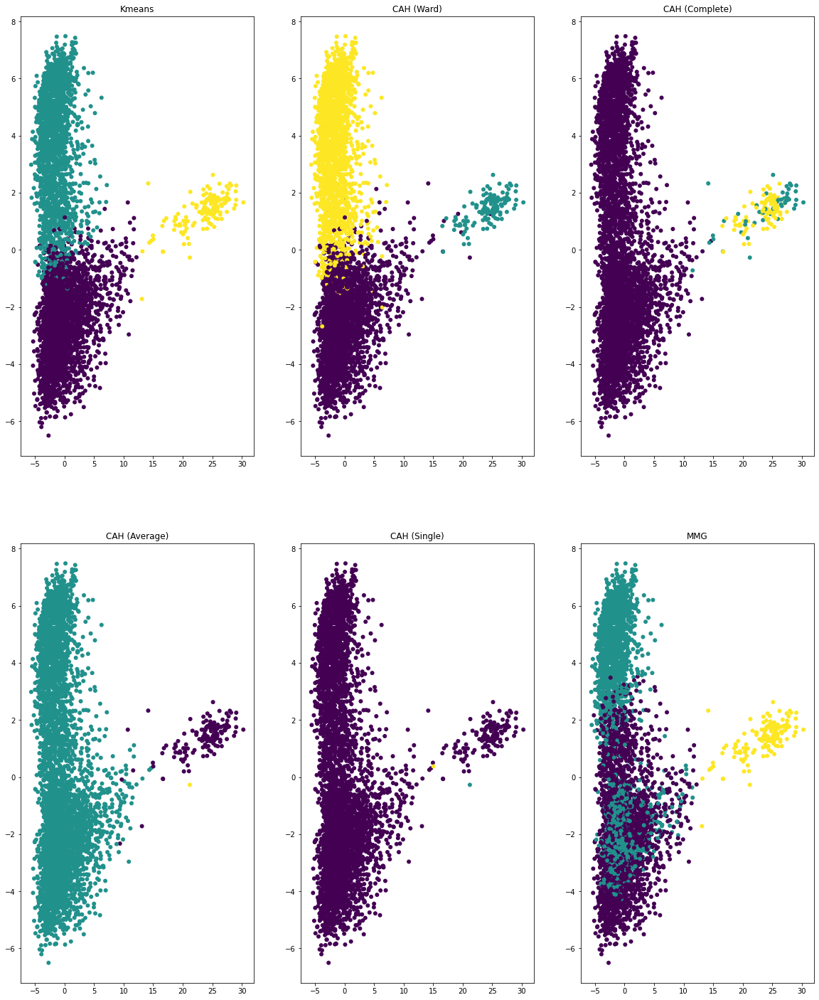

time: 1.45 s (started: 2021-12-11 17:09:25 +00:00)


In [32]:
eval_clustering_2D(X_reduced, [kmeans_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

Nous pouvons voir que kmeans, CAH(Ward), et MMG convergent vers le même modèle alors que les autres ont des classifications aléatoires qui favorisent une des classes par rapport aux autres.

Nota: On va utiliser le nom de la mesure de dissimilarité comme equivalent au nom du modele sans perte de clarite dans ce qui suit

#### Espace Reduit

PCA avec 2 composantes

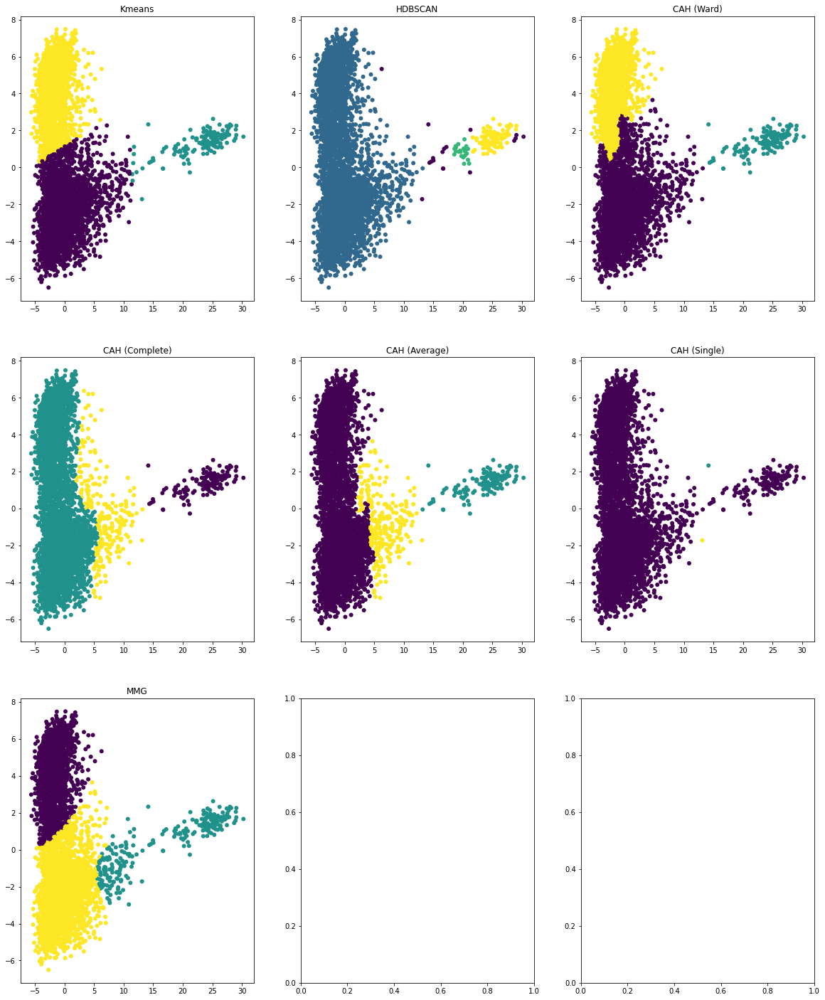

In [16]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(articles2_roberta)
run_clustering(X_reduced, k_articles2)

PCA avec 20 composantes

time: 6.49 s (started: 2021-12-11 16:41:03 +00:00)


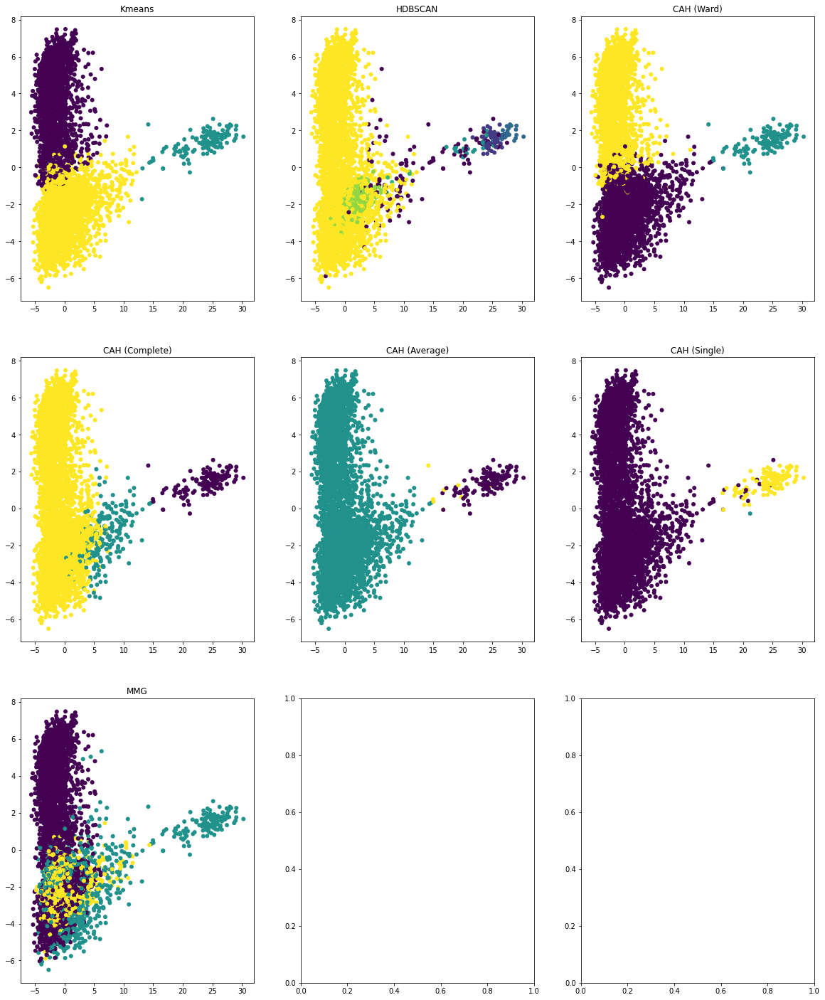

time: 9.26 s (started: 2021-12-11 16:41:09 +00:00)


In [17]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(articles2_roberta)
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'une ACP à 2  kmeans, Ward, Maximum vers le meme modele et MMG vers un modele assez proche. 

TSNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


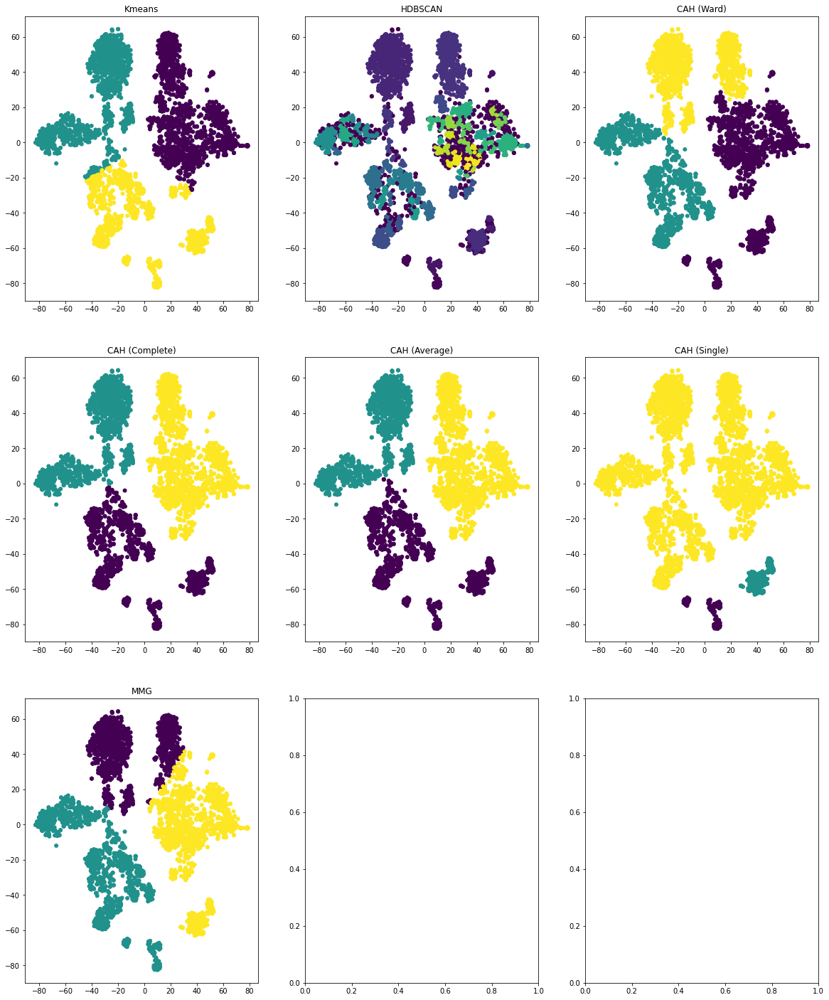

time: 1min 3s (started: 2021-12-11 16:41:19 +00:00)


In [18]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(articles2_roberta)
run_clustering(X_reduced_tsne, k_articles2)

- Nous pouvons voir que l'utilisation d'une tSNE fait converger kmeans, et MMG vers le même modèle. 

UMAP

In [19]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(articles2_roberta)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


time: 34.6 s (started: 2021-12-11 16:42:23 +00:00)


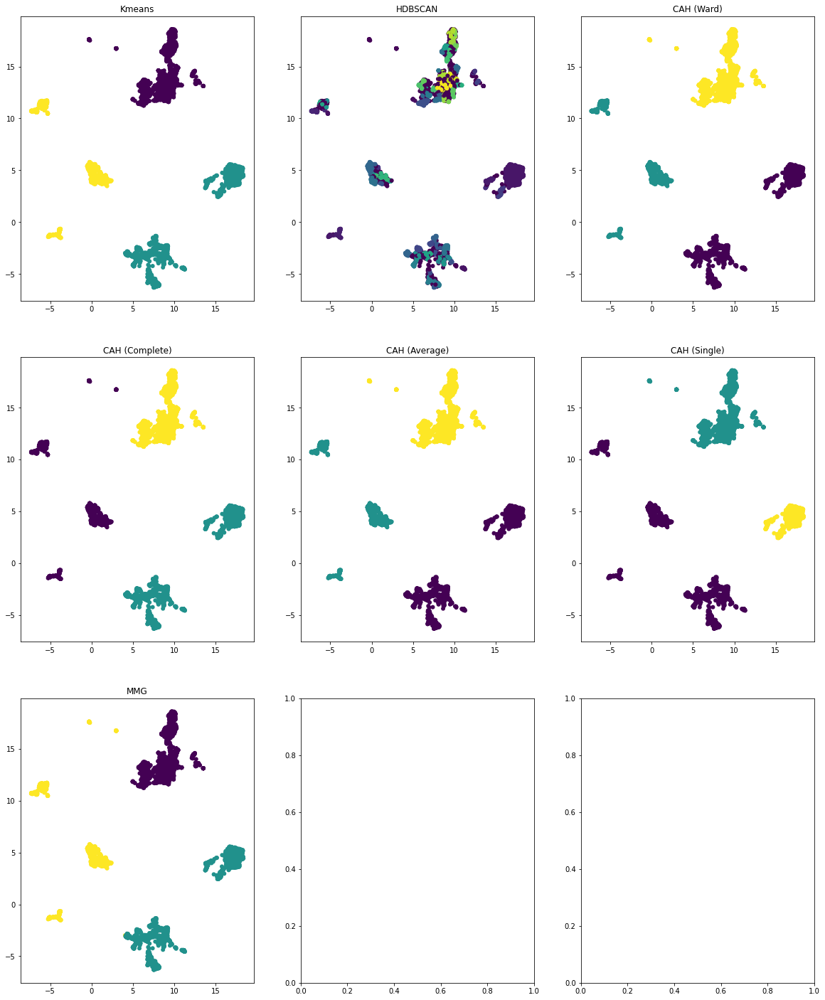

time: 3.81 s (started: 2021-12-11 16:42:57 +00:00)


In [20]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation d'UMAP fait converger kmeans, ward et MMG vers approximativement le même modèle.
On va prendre celui de MMG comme reference

Autoencoder

In [21]:
n_components=2
X_reduced = autoencoder(articles2_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:41<00:00,  1.21it/s]

time: 51.7 s (started: 2021-12-11 16:43:01 +00:00)


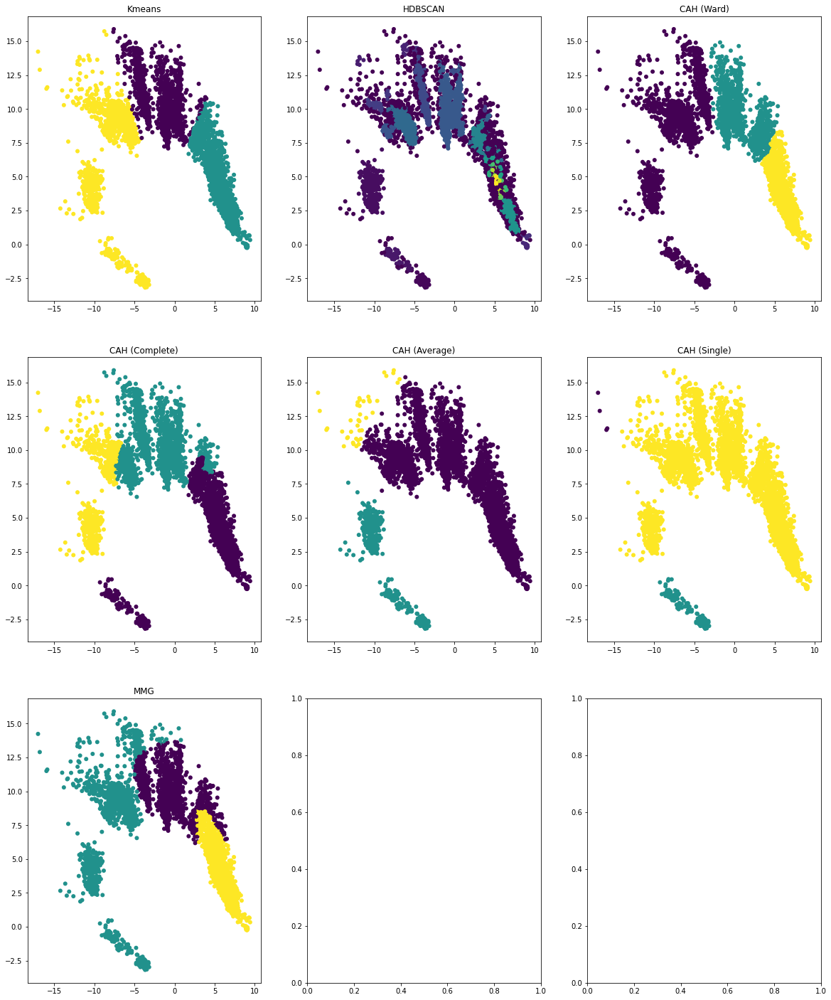

time: 4.55 s (started: 2021-12-11 16:43:53 +00:00)


In [22]:
run_clustering(X_reduced, k_articles2)

- Nous pouvons voir que l'utilisation de l'espace d'un autoencoder fait converger kmeans, Ward, et MMG vers approximativement le même modèle. 

#### Interpretations des resultats 

In [23]:

pca_space = PCA(n_components=2, random_state=42).fit_transform(articles2_roberta)

tsne_space = TSNE(n_components=2, random_state=42).fit_transform(articles2_roberta)

umap_space = UMAP(n_components=2, random_state=42).fit_transform(articles2_roberta)

autoencoder_space = autoencoder(articles2_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:40<00:00,  1.23it/s]

time: 2min 4s (started: 2021-12-11 16:43:57 +00:00)


In [24]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 38 ms (started: 2021-12-11 16:46:02 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 1


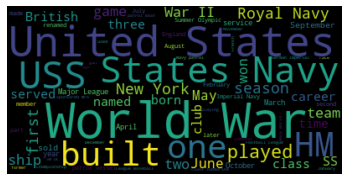



Class: 0


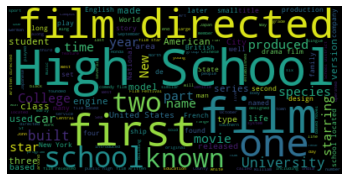



Class: 2


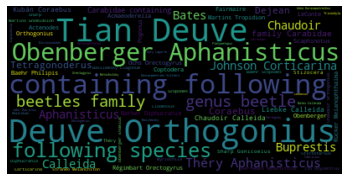



time: 3.9 s (started: 2021-12-11 17:09:26 +00:00)


In [33]:
original_labels = gaussian
print_wordcloud(texts, original_labels)

Class: 0


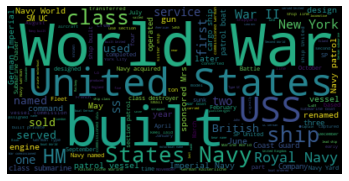



Class: 2


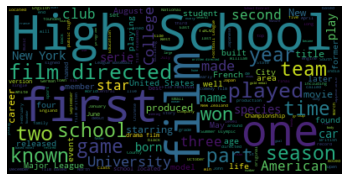



Class: 1


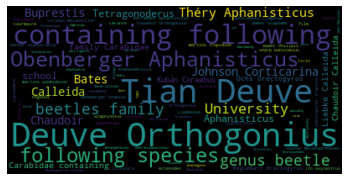



time: 4.6 s (started: 2021-12-11 16:46:02 +00:00)


In [25]:
pca_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(pca_space)
print_wordcloud(texts, pca_labels)

Class: 2


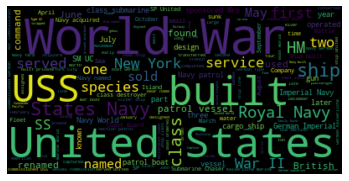



Class: 0


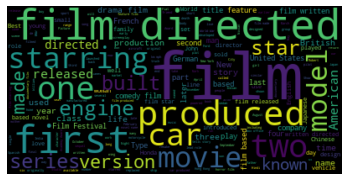



Class: 1


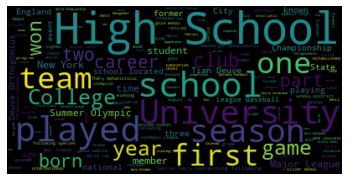



time: 4.07 s (started: 2021-12-11 16:46:07 +00:00)


In [26]:
tsne_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(tsne_space)
print_wordcloud(texts, tsne_labels)

Class: 0


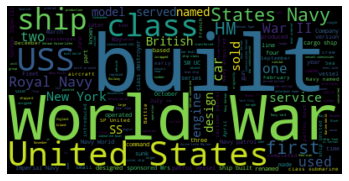



Class: 1


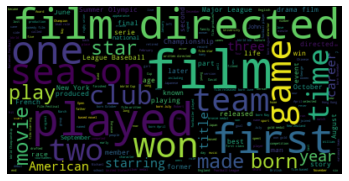



Class: 2


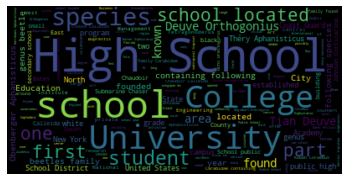



time: 4.07 s (started: 2021-12-11 16:46:11 +00:00)


In [27]:
umap_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(umap_space)
print_wordcloud(texts, umap_labels)

Class: 2


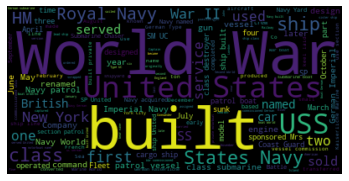



Class: 1


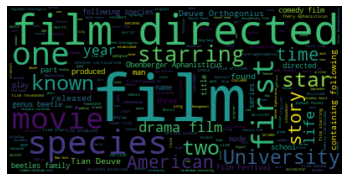



Class: 0


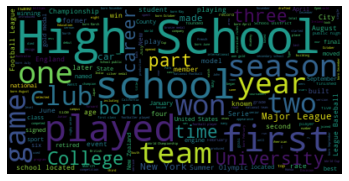



time: 4.16 s (started: 2021-12-11 16:46:15 +00:00)


In [28]:
autoencoder_labels = GaussianMixture(n_components=k_articles2, random_state=42).fit_predict(autoencoder_space)
print_wordcloud(texts, autoencoder_labels)

Nous pouvons voir que tous les meilleurs modèles, chacun provenant des modèles de chaque technique de réduction de la dimensionnalité, ont tous approximativement la même classification.